# Check

In [2]:
from __future__ import print_function
from packaging.version import parse as Version
from platform import python_version

OK = '\x1b[42m[ OK ]\x1b[0m'
FAIL = "\x1b[41m[FAIL]\x1b[0m"

try:
    import importlib
except ImportError:
    print(FAIL, "Python version 3.10 is required,"
                " but %s is installed." % sys.version)

def import_version(pkg, min_ver, fail_msg=""):
    mod = None
    try:
        mod = importlib.import_module(pkg)
        if pkg in {'PIL'}:
            ver = mod.VERSION
        else:
            ver = mod.__version__
        if Version(ver) == Version(min_ver):
            print(OK, "%s version %s is installed."
                  % (lib, min_ver))
        else:
            print(FAIL, "%s version %s is required, but %s installed."
                  % (lib, min_ver, ver))    
    except ImportError:
        print(FAIL, '%s not installed. %s' % (pkg, fail_msg))
    return mod


# first check the python version
pyversion = Version(python_version())

if pyversion >= Version("3.10"):
    print(OK, "Python version is %s" % pyversion)
elif pyversion < Version("3.10"):
    print(FAIL, "Python version 3.10 is required,"
                " but %s is installed." % pyversion)
else:
    print(FAIL, "Unknown Python version: %s" % pyversion)

    
print()
requirements = {'numpy': "1.22.4", 'matplotlib': "3.5.2",'sklearn': "1.1.1", 
                'pandas': "1.4.2",'xgboost': "1.5.1", 'shap': "0.40.0"}

# now the dependencies
for lib, required_version in list(requirements.items()):
    import_version(lib, required_version)

[ OK ] Python version is 3.10.5

[ OK ] numpy version 1.22.4 is installed.
[ OK ] matplotlib version 3.5.2 is installed.
[ OK ] sklearn version 1.1.1 is installed.
[ OK ] pandas version 1.4.2 is installed.
[ OK ] xgboost version 1.5.1 is installed.


/Users/dylan/opt/anaconda3/envs/Data1030/lib/python3.10/site-packages/xgboost/compat.py:36: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  from pandas import MultiIndex, Int64Index


[ OK ] shap version 0.40.0 is installed.


# Import Libraries

In [35]:
import numpy as np
import pandas as pd
from matplotlib import pyplot as plt
import seaborn as sns
import glob
from sklearn.model_selection import train_test_split
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import StandardScaler, OneHotEncoder, MinMaxScaler
import plotly.express as px
import pickle
import warnings

warnings.filterwarnings("ignore")

# Read CSV file

## load all data sheets

In [448]:
all_csv_files = glob.glob("../dataset/*.csv")
all_csv_files

['../dataset/bmw.csv',
 '../dataset/vw.csv',
 '../dataset/audi.csv',
 '../dataset/toyota.csv',
 '../dataset/hyundai.csv',
 '../dataset/ford.csv']

## view columns of all data sheets

In [449]:
for i in all_csv_files:
    pd.read_csv(i)
    print(i)
    print(pd.read_csv(i).columns)
    print('-'*50)

../dataset/bmw.csv
Index(['model', 'year', 'price', 'transmission', 'mileage', 'fuelType', 'tax',
       'mpg', 'engineSize'],
      dtype='object')
--------------------------------------------------
../dataset/vw.csv
Index(['model', 'year', 'price', 'transmission', 'mileage', 'fuelType', 'tax',
       'mpg', 'engineSize'],
      dtype='object')
--------------------------------------------------
../dataset/audi.csv
Index(['model', 'year', 'price', 'transmission', 'mileage', 'fuelType', 'tax',
       'mpg', 'engineSize'],
      dtype='object')
--------------------------------------------------
../dataset/toyota.csv
Index(['model', 'year', 'price', 'transmission', 'mileage', 'fuelType', 'tax',
       'mpg', 'engineSize'],
      dtype='object')
--------------------------------------------------
../dataset/hyundai.csv
Index(['model', 'year', 'price', 'transmission', 'mileage', 'fuelType',
       'tax(£)', 'mpg', 'engineSize'],
      dtype='object')
-----------------------------------------

### 1. Notice that the hyundi.csv has a column name called "tax(£)" which is different than others. 
### 2. Add brand name to each row. 
### 3. merge all sheets. 

In [450]:
car_data=[]

for i in all_csv_files:
    #add brand column
    brand = i.replace("../dataset/","").split('.')[0]
    df=pd.read_csv(i)
    df['brand'] = brand
    
    #fix column name in hyundi.csv
    #if i == '/Users/dylan/Documents/BROWN/DATA1030/DATA1030-Assignment/Project/dataset/hyundi.csv':
    df.rename(columns={'tax(£)': 'roadTax',"tax": "roadTax"}, inplace=True)
    
        
    car_data.append(df)

#merge all sheets
car_data = pd.concat(car_data, axis=0, ignore_index=True)
car_data.tail()


,model,year,price,transmission,mileage,fuelType,roadTax,mpg,engineSize,brand
66165,B-MAX,2017,8999,Manual,16700,Petrol,150,47.1,1.4,ford
66166,B-MAX,2014,7499,Manual,40700,Petrol,30,57.7,1.0,ford
66167,Focus,2015,9999,Manual,7010,Diesel,20,67.3,1.6,ford
66168,KA,2018,8299,Manual,5007,Petrol,145,57.7,1.2,ford
66169,Focus,2015,8299,Manual,5007,Petrol,22,57.7,1.0,ford


# EDA
## The size of data

In [451]:
print("The rows we have in the data is:",car_data.shape[0])
print("The columns we have in the data is:",car_data.shape[1])

The rows we have in the data is: 66170
The columns we have in the data is: 10


## Missing value

In [452]:
car_data.isnull().sum()

model           0
year            0
price           0
transmission    0
mileage         0
fuelType        0
roadTax         0
mpg             0
engineSize      0
brand           0
dtype: int64

### From information above, we know there is no missing value in the dataset.

## Types of data

In [453]:
print(car_data.info())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 66170 entries, 0 to 66169
Data columns (total 10 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   model         66170 non-null  object 
 1   year          66170 non-null  int64  
 2   price         66170 non-null  int64  
 3   transmission  66170 non-null  object 
 4   mileage       66170 non-null  int64  
 5   fuelType      66170 non-null  object 
 6   roadTax       66170 non-null  int64  
 7   mpg           66170 non-null  float64
 8   engineSize    66170 non-null  float64
 9   brand         66170 non-null  object 
dtypes: float64(2), int64(4), object(4)
memory usage: 5.0+ MB
None


### From information above, we conclude that there are 10 variables in dataset. Four variables are string type, other six variables are numeric type.

## Target variable information

In [454]:
car_data['price'].describe()

count     66170.000000
mean      16798.161538
std        9503.386810
min         495.000000
25%       10280.000000
50%       14690.000000
75%       20640.750000
max      145000.000000
Name: price, dtype: float64

## View models of each brand

In [455]:
print("The number of bands we have is:",len(car_data['brand'].unique()))
print("The number of models we have is:",len(car_data['model'].unique()))
print("="*50)
for i in car_data['brand'].unique():
    dataset=car_data[car_data['brand']==i]
    print("for brand {}, we have {} models, they are as below.".format(i.upper(),len(dataset['model'].unique())))
    print("The models we have is:",dataset['model'].unique())
    print("-"*50)

The number of bands we have is: 6
The number of models we have is: 135
for brand BMW, we have 24 models, they are as below.
The models we have is: [' 5 Series' ' 6 Series' ' 1 Series' ' 7 Series' ' 2 Series' ' 4 Series'
 ' X3' ' 3 Series' ' X5' ' X4' ' i3' ' X1' ' M4' ' X2' ' X6' ' 8 Series'
 ' Z4' ' X7' ' M5' ' i8' ' M2' ' M3' ' M6' ' Z3']
--------------------------------------------------
for brand VW, we have 27 models, they are as below.
The models we have is: [' T-Roc' ' Golf' ' Passat' ' T-Cross' ' Polo' ' Tiguan' ' Sharan' ' Up'
 ' Scirocco' ' Beetle' ' Caddy Maxi Life' ' Caravelle' ' Touareg'
 ' Arteon' ' Touran' ' Golf SV' ' Amarok' ' Tiguan Allspace' ' Shuttle'
 ' Jetta' ' CC' ' California' ' Caddy Life' ' Caddy' ' Caddy Maxi' ' Eos'
 ' Fox']
--------------------------------------------------
for brand AUDI, we have 26 models, they are as below.
The models we have is: [' A1' ' A6' ' A4' ' A3' ' Q3' ' Q5' ' A5' ' S4' ' Q2' ' A7' ' TT' ' Q7'
 ' RS6' ' RS3' ' A8' ' Q8' ' RS4' ' 

### Noticed that model names ' Focus' and 'Focus' are actually the same one, but because of space made them viewed as different one. 

In [456]:
car_data['model'] = car_data['model'].str.lstrip()
print("The number of models we have is:",len(car_data['model'].unique()))
print("-"*50)
print(car_data['model'].unique())

The number of models we have is: 134
--------------------------------------------------
['5 Series' '6 Series' '1 Series' '7 Series' '2 Series' '4 Series' 'X3'
 '3 Series' 'X5' 'X4' 'i3' 'X1' 'M4' 'X2' 'X6' '8 Series' 'Z4' 'X7' 'M5'
 'i8' 'M2' 'M3' 'M6' 'Z3' 'T-Roc' 'Golf' 'Passat' 'T-Cross' 'Polo'
 'Tiguan' 'Sharan' 'Up' 'Scirocco' 'Beetle' 'Caddy Maxi Life' 'Caravelle'
 'Touareg' 'Arteon' 'Touran' 'Golf SV' 'Amarok' 'Tiguan Allspace'
 'Shuttle' 'Jetta' 'CC' 'California' 'Caddy Life' 'Caddy' 'Caddy Maxi'
 'Eos' 'Fox' 'A1' 'A6' 'A4' 'A3' 'Q3' 'Q5' 'A5' 'S4' 'Q2' 'A7' 'TT' 'Q7'
 'RS6' 'RS3' 'A8' 'Q8' 'RS4' 'RS5' 'R8' 'SQ5' 'S8' 'SQ7' 'S3' 'S5' 'A2'
 'RS7' 'GT86' 'Corolla' 'RAV4' 'Yaris' 'Auris' 'Aygo' 'C-HR' 'Prius'
 'Avensis' 'Verso' 'Hilux' 'PROACE VERSO' 'Land Cruiser' 'Supra' 'Camry'
 'Verso-S' 'IQ' 'Urban Cruiser' 'I20' 'Tucson' 'I10' 'IX35' 'I30' 'I40'
 'Ioniq' 'Kona' 'Veloster' 'I800' 'IX20' 'Santa Fe' 'Accent' 'Terracan'
 'Getz' 'Amica' 'Fiesta' 'Focus' 'Puma' 'Kuga' 'EcoSport' 

### The number of models in dataset is 134.

## Year of the cars

In [457]:
print(car_data['year'].value_counts().sort_index())

1996        2
1997        2
1998        4
1999        5
2000        6
2001        8
2002       17
2003       22
2004       31
2005       50
2006       64
2007      110
2008      151
2009      217
2010      224
2011      308
2012      463
2013     1896
2014     2870
2015     5300
2016    10537
2017    14688
2018     9237
2019    16917
2020     3040
2060        1
Name: year, dtype: int64


### Notice that there is one car with year 2060. It is definitely wrong.

In [458]:
car_data.drop(index=(car_data[car_data['year']==2060].index),inplace=True)
print(car_data['year'].value_counts().sort_index())

1996        2
1997        2
1998        4
1999        5
2000        6
2001        8
2002       17
2003       22
2004       31
2005       50
2006       64
2007      110
2008      151
2009      217
2010      224
2011      308
2012      463
2013     1896
2014     2870
2015     5300
2016    10537
2017    14688
2018     9237
2019    16917
2020     3040
Name: year, dtype: int64


## Visualization
### Car price distribution

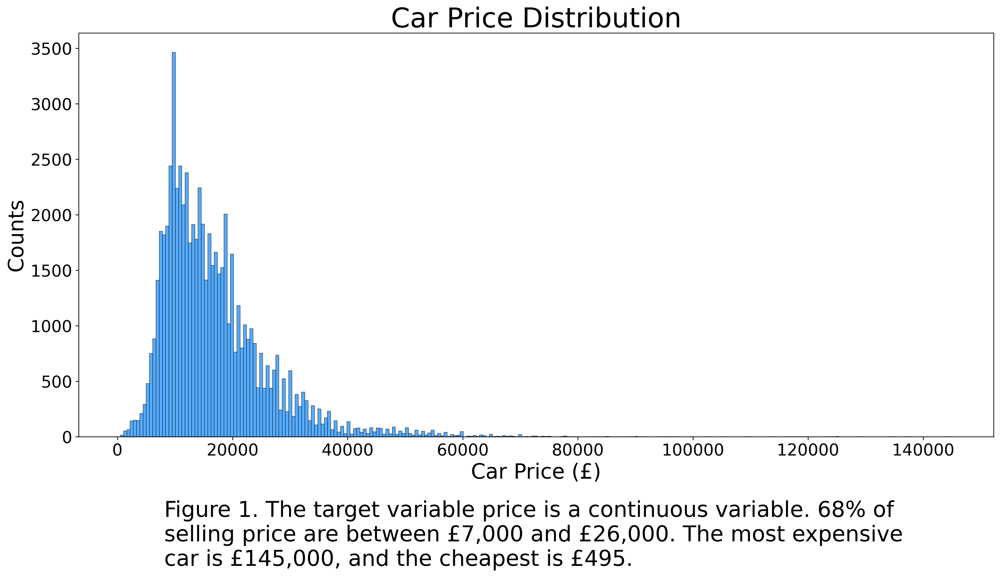

In [678]:
plt.figure(figsize=(18,8),dpi=300)
plt.title('Car Price Distribution',fontsize=30)
sns.histplot(x=car_data['price'],color="dodgerblue",bins=int(np.sqrt(len(car_data['price']))))
plt.ylabel('Counts',fontsize=23)
plt.xlabel('Car Price (£)',fontsize=23)
plt.yticks(fontsize=18)
plt.xticks(fontsize=18)
txt="""Figure 1. The target variable price is a continuous variable. 68% of 
selling price are between £7,000 and £26,000. The most expensive 
car is £145,000, and the cheapest is £495."""
plt.figtext(0.1975, -0.13, s=txt, wrap=True, horizontalalignment='left', fontsize=24)
plt.savefig('../figures/Car price distribution.png', dpi=300, bbox_inches='tight')
plt.show() 


### Outliers of target variable

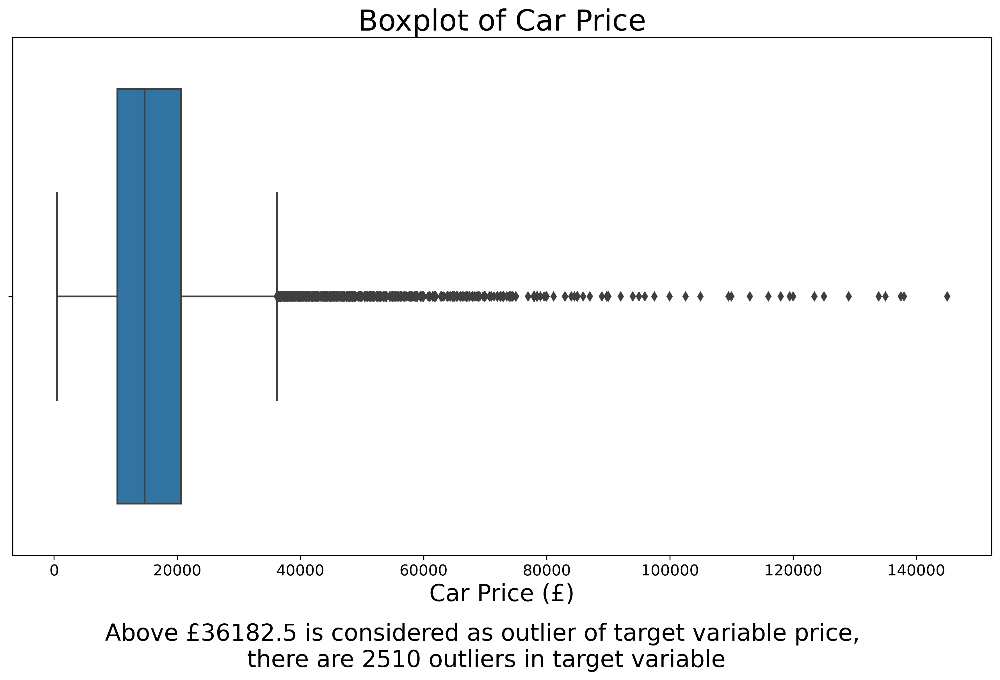

above 36182.5 is considered as outlier of price, the details is as below:


168      54998
189      61898
217      36995
226      45898
227      37898
         ...  
61560    37500
61635    42000
64404    37300
65508    39995
66070    48000
Name: price, Length: 2510, dtype: int64

In [460]:
plt.figure(figsize=(15,8),dpi=300)
plt.title('Boxplot of Car Price',fontsize=25)
sns.boxplot(x=car_data['price'])
plt.xlabel('Car Price (£)',fontsize=20)
txt="""Above £36182.5 is considered as outlier of target variable price, 
there are 2510 outliers in target variable"""
plt.figtext(0.5, -0.05, s=txt, wrap=True, horizontalalignment='center', fontsize=20)
plt.savefig('../figures/Car price boxplot.jpg', dpi=300, bbox_inches='tight')
plt.show() 

# calculate Q1 and Q3
Q1 = car_data['price'].quantile(0.25)
Q3 = car_data['price'].quantile(0.75)

# calculate the IQR
IQR = Q3 - Q1

print('='*50)
print("above {} is considered as outlier of price, the details is as below:".format(Q3 + 1.5 * IQR))
# filter the dataset with the IQR
IQR_outliers = car_data['price'][((car_data['price'] < (Q1 - 1.5 * IQR)) |(car_data['price'] > (Q3 + 1.5 * IQR)))]
IQR_outliers


### Year

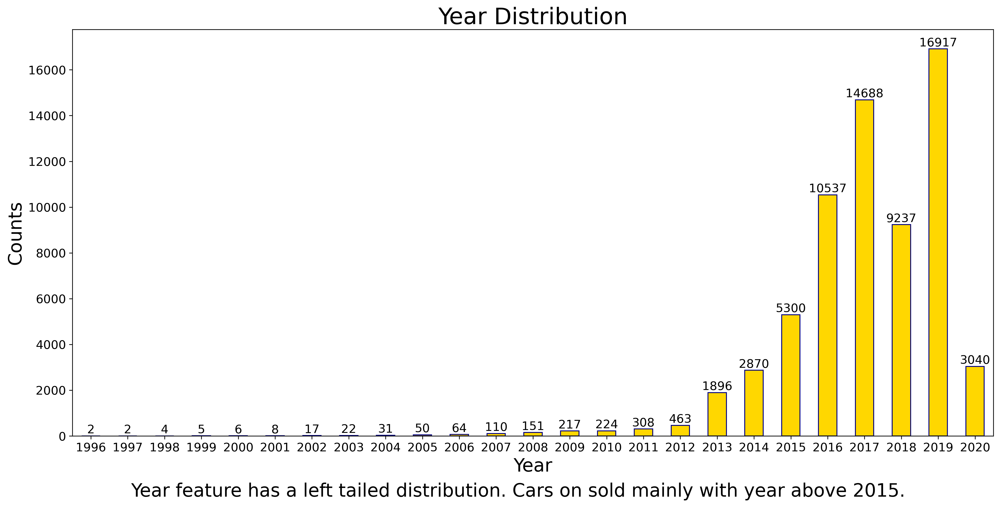

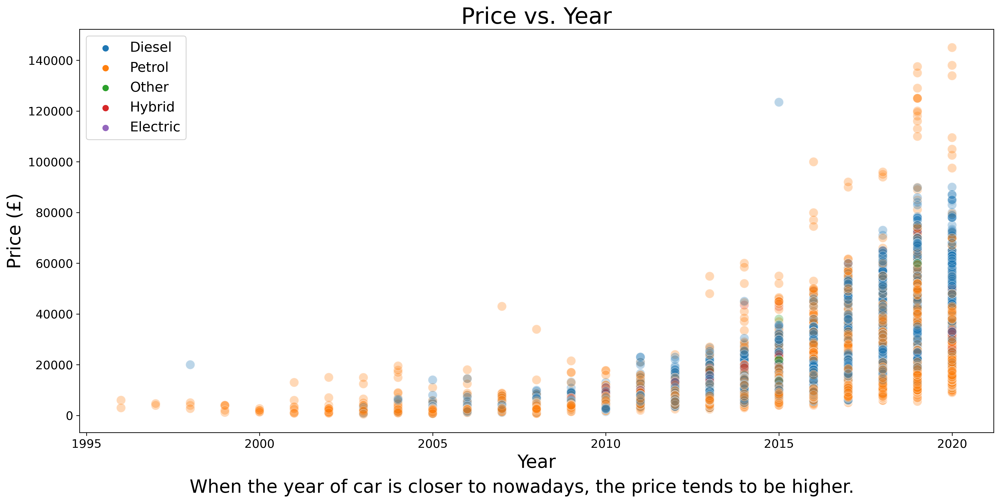

In [496]:
#year barplot
plt.figure(figsize=(18,8),dpi=300)
car_data['year'].value_counts().sort_index().plot.bar(edgecolor = "navy",color="gold")
plt.ylabel('Counts',fontsize=20)
plt.xlabel('Year',fontsize=20)
plt.title('Year Distribution',fontsize=25)
plt.xticks(rotation = 0)
k=0
for i in car_data['year'].value_counts().sort_index():
    plt.text(k, i+110, "{}".format(i), ha = 'center')
    k=k+1
txt="""Year feature has a left tailed distribution. Cars on sold mainly with year above 2015."""
plt.figtext(0.5, -0.005, s=txt, wrap=True, horizontalalignment='center', fontsize=20)
plt.savefig('../figures/Year distribution.jpg', dpi=300, bbox_inches='tight')

#year scatterplot
plt.figure(figsize=(18,8),dpi=300)
sns.scatterplot(data=car_data, x="year", y="price",alpha=0.3,hue="fuelType",s=100)
plt.xlabel('Year',fontsize=20)
plt.ylabel('Price (£)',fontsize=20)
plt.title('Price vs. Year',fontsize=25)
plt.legend(fontsize=15)
txt="""When the year of car is closer to nowadays, the price tends to be higher."""
plt.figtext(0.5, -0.005, s=txt, wrap=True, horizontalalignment='center', fontsize=20)
plt.savefig('../figures/Price vs. Year scatterplot.jpg', dpi=300, bbox_inches='tight')
plt.show()

#print(car_data.sort_values(by=['price']))
#print(car_data[car_data['fuelType']=='Diesel'])
#print((car_data[car_data['model']=='Land Cruiser'].price))
#print(car_data.sort_values(by=['year']).head(10))
#print(car_data[car_data['fuelType']=='Diesel'].sort_values(by=['price']))

### Brand

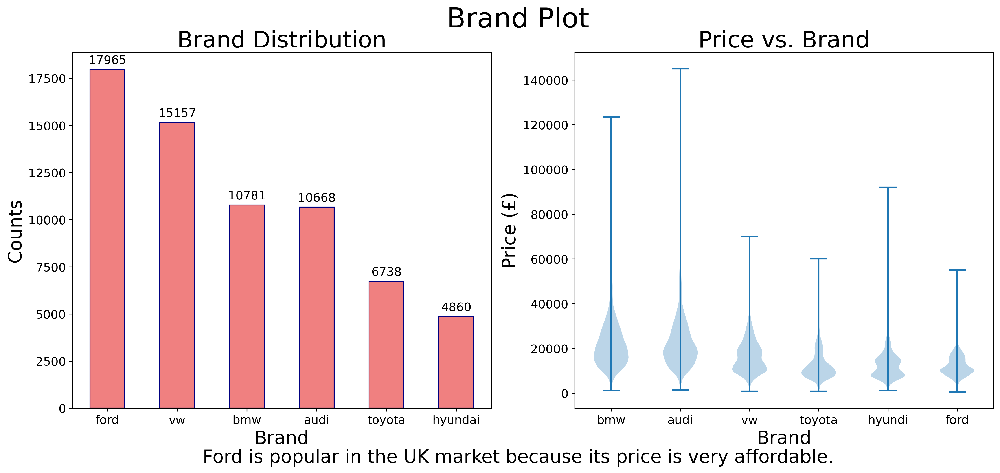

In [497]:
plt.figure(figsize=(18,7),dpi=300)
plt.suptitle('Brand Plot',fontsize=30)

#FuelType barplot
plt.subplot(1,2,1)
car_data['brand'].value_counts().plot.bar(edgecolor = "navy",color="lightcoral")
plt.ylabel('Counts',fontsize=20)
plt.xlabel('Brand',fontsize=20)
plt.title('Brand Distribution',fontsize=25)
plt.xticks(rotation = 0)
k=0
for i in car_data['brand'].value_counts():
    plt.text(k, i+300, "{}".format(i), ha = 'center')
    k=k+1

#price vs. fuel type
plt.subplot(1,2,2)
dataset = [car_data[car_data['brand']=='bmw']['price'].values,
           car_data[car_data['brand']=='audi']['price'].values,
          car_data[car_data['brand']=='vw']['price'].values,
          car_data[car_data['brand']=='toyota']['price'].values,
          car_data[car_data['brand']=='hyundai']['price'].values,
          car_data[car_data['brand']=='ford']['price'].values,]

plt.violinplot(dataset = dataset)
plt.xticks([1,2,3,4,5,6],['bmw','audi','vw','toyota','hyundi','ford'])
plt.ylabel('Price (£)',fontsize=20)
plt.xlabel('Brand',fontsize=20)
plt.title('Price vs. Brand',fontsize=25)
txt="""Ford is popular in the UK market because its price is very affordable."""
plt.figtext(0.5, -0.008, s=txt, wrap=True, horizontalalignment='center', fontsize=20)
plt.savefig('../figures/Brand plot.jpg', dpi=300, bbox_inches='tight')
plt.show()


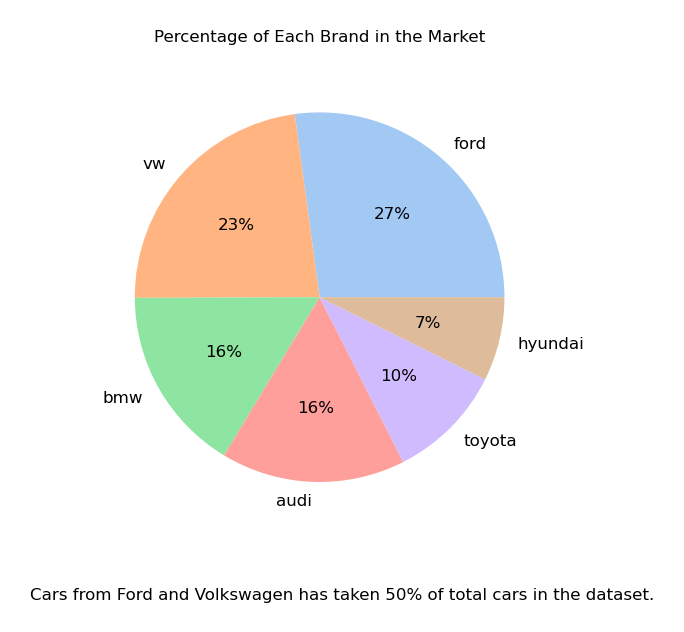

In [463]:
pie=car_data["brand"].value_counts().reset_index()
pie.columns=["brand","count"]
plt.figure(figsize=(2,2),dpi=300)
color=sns.color_palette("pastel")
plt.pie(pie["count"],colors=color,autopct='%.0f%%',labels=pie["brand"],textprops={'fontsize': 4})
plt.title('Percentage of Each Brand in the Market',fontsize=4)
txt="""Cars from Ford and Volkswagen has taken 50% of total cars in the dataset."""
plt.figtext(0.55, -0.008, s=txt, wrap=True, horizontalalignment='center', fontsize=4)
plt.savefig('../figures/Brand piechart.jpg', dpi=300, bbox_inches='tight')
plt.show()

### Model

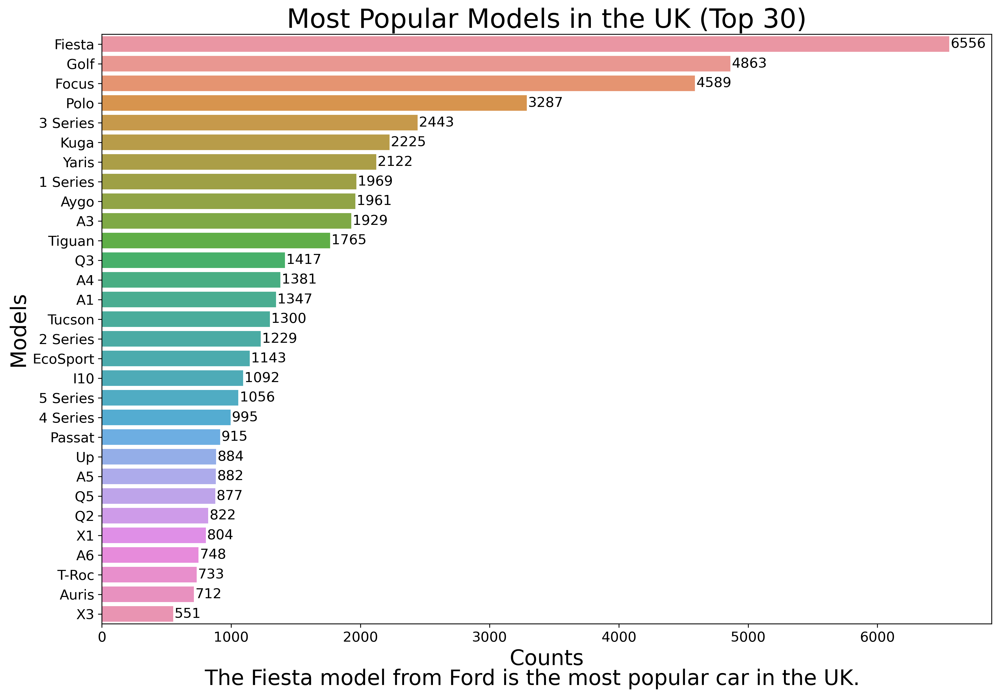

In [464]:
#Number of each model
plt.figure(figsize=(15,10),dpi=300)
plt.title('Most Popular Models in the UK (Top 30)',fontsize=25)
sns.countplot(y=car_data['model'],order = car_data['model'].value_counts().index[:30])

k=0
for i in car_data['model'].value_counts()[:30]:
    plt.text(i+10, k, "{}".format(i), va = 'center')
    k=k+1
plt.ylabel('Models',fontsize=20)
plt.xlabel('Counts',fontsize=20)
txt="""The Fiesta model from Ford is the most popular car in the UK."""
plt.figtext(0.5, 0.03, s=txt, wrap=True, horizontalalignment='center', fontsize=20)
plt.savefig('../figures/Most popular models (Top 30).jpg', dpi=300, bbox_inches='tight')
plt.show() 

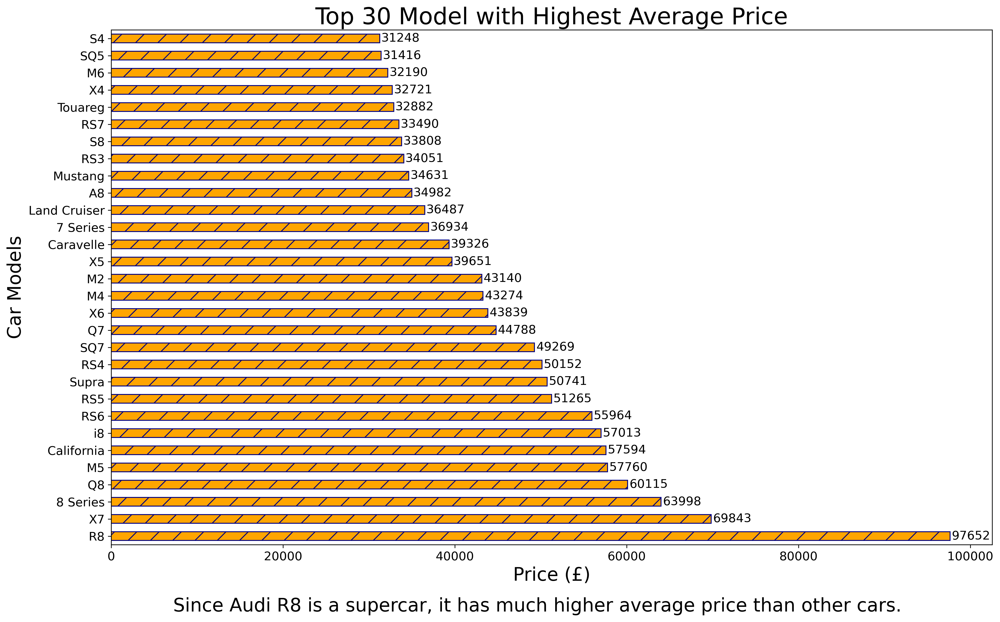

In [505]:
#average price of each model
mean_car_price= car_data.groupby('model').price.mean().sort_values(ascending=False)
#print(mean_car_price)

patterns = [ "/" ]
plt.figure(figsize=(17,10),dpi=300)
mean_car_price[:30].plot.barh(edgecolor = "navy",color="orange",hatch=patterns[0])
plt.ylabel('Car Models',fontsize=20)
plt.xlabel('Price (£)',fontsize=20)
plt.title('Top 30 Model with Highest Average Price',fontsize=25)
k=0
for i in mean_car_price[:30]:
    plt.text(i+200, k, "{:.0f}".format(i), va = 'center')
    k=k+1
txt="""Since Audi R8 is a supercar, it has much higher average price than other cars."""
plt.figtext(0.5, 0.01, s=txt, wrap=True, horizontalalignment='center', fontsize=20)
plt.savefig('../figures/Top 30 model with highest average price.jpg', dpi=300, bbox_inches='tight')
    
plt.show()

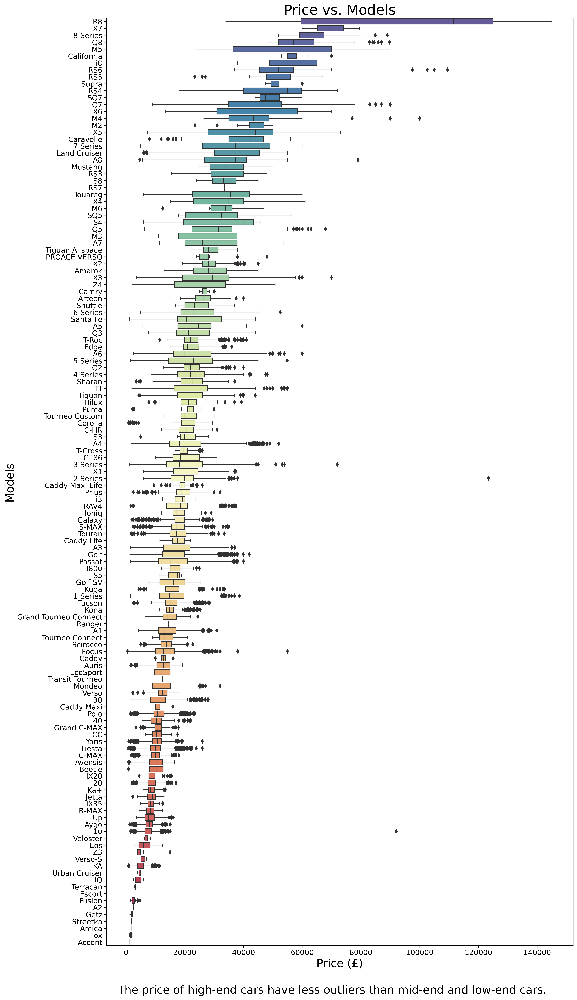

In [507]:
#price vs. models
my_order = car_data.groupby('model').price.mean().sort_values(ascending=False).index

plt.figure(figsize=(15,30),dpi=300)

sns.boxplot(y=car_data["model"], x=car_data["price"],order=my_order,palette="Spectral_r", linewidth=1)
plt.xlabel('Price (£)',fontsize=20)
plt.ylabel('Models',fontsize=20)
plt.title('Price vs. Models',fontsize=25)
txt="""The price of high-end cars have less outliers than mid-end and low-end cars."""
plt.figtext(0.5, 0.07, s=txt, wrap=True, horizontalalignment='center', fontsize=20)
plt.savefig('../figures/Price vs. Models boxplot.jpg', dpi=300, bbox_inches='tight')
plt.show()

### Transmission

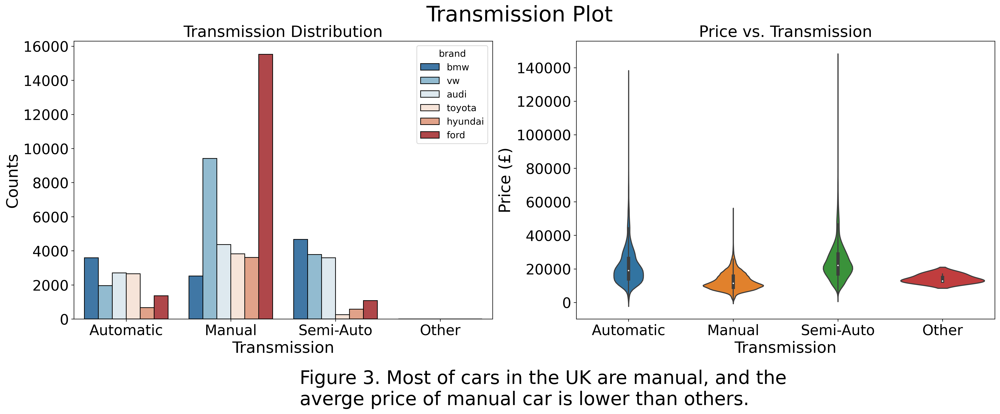

In [529]:
plt.figure(figsize=(23,7),dpi=300)
plt.suptitle('Transmission Plot',fontsize=30)

#transmission barplot
plt.subplot(1,2,1)
sns.countplot(data=car_data, x='transmission', hue='brand',palette='RdBu_r',edgecolor="black")
plt.xlabel('Transmission',fontsize=22)
plt.ylabel('Counts',fontsize=22)
plt.yticks(fontsize=20)
plt.xticks(fontsize=20)
plt.title('Transmission Distribution',fontsize=22)

#transmission vs. price
plt.subplot(1,2,2)
sns.violinplot(data=car_data, y="price", x="transmission")

plt.xlabel('Transmission',fontsize=22)
plt.ylabel('Price (£)',fontsize=22)
plt.yticks(fontsize=20)
plt.xticks(fontsize=20)
plt.title('Price vs. Transmission',fontsize=22)

txt="""Figure 3. Most of cars in the UK are manual, and the 
averge price of manual car is lower than others."""
plt.figtext(0.315, -0.12, s=txt, wrap=True, horizontalalignment='left', fontsize=26)
plt.savefig('../figures/Transmission plot.png', dpi=300, bbox_inches='tight')
plt.show()

### Mileage

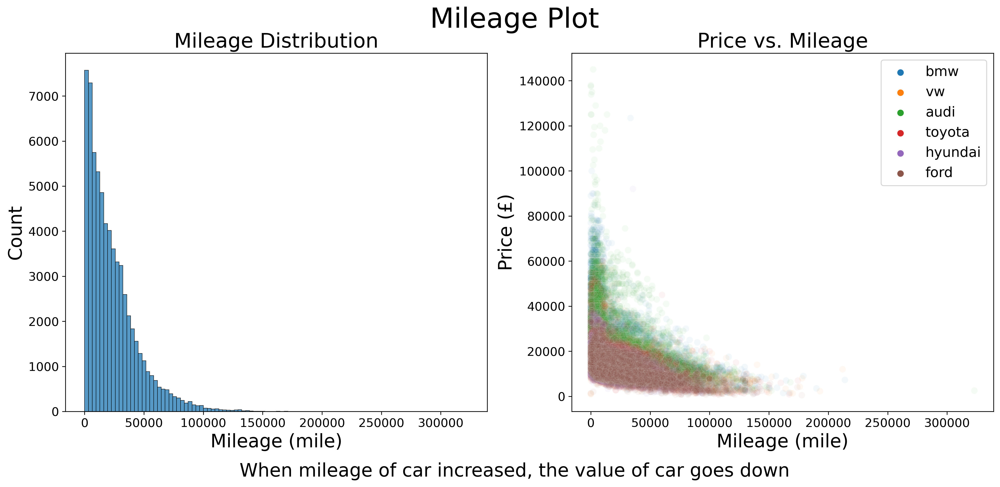

In [531]:
plt.figure(figsize=(18,7),dpi=300)
plt.suptitle('Mileage Plot',fontsize=30)

#histogram of mileage
plt.subplot(1,2,1)
sns.histplot(data=car_data, x="mileage",bins=100)
plt.xlabel('Mileage (mile)',fontsize=20)
plt.ylabel('Count',fontsize=20)
plt.title('Mileage Distribution',fontsize=22)

#price vs. mileage
plt.subplot(1,2,2)
sns.scatterplot(data=car_data, x="mileage", y="price",alpha=0.05,hue="brand",s=50)
plt.xlabel('Mileage (mile)',fontsize=20)
plt.ylabel('Price (£)',fontsize=20)
plt.title('Price vs. Mileage',fontsize=22)
plt.legend(fontsize=15)

txt="""When mileage of car increased, the value of car goes down"""
plt.figtext(0.5, -0.03, s=txt, wrap=True, horizontalalignment='center', fontsize=20)
plt.savefig('../figures/Mileage plot.jpg', dpi=300, bbox_inches='tight')
plt.show()

### FuelType

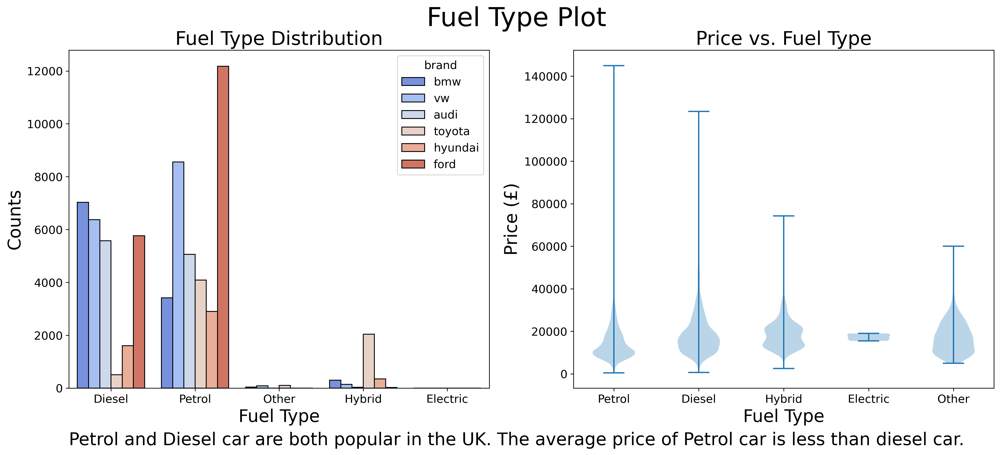

In [532]:
plt.figure(figsize=(19,7),dpi=300)
plt.suptitle('Fuel Type Plot',fontsize=30)

#FuelType barplot
plt.subplot(1,2,1)
sns.countplot(data=car_data, x='fuelType', hue='brand',palette='coolwarm',edgecolor="black")
plt.xlabel('Fuel Type',fontsize=20)
plt.ylabel('Counts',fontsize=20)
plt.title('Fuel Type Distribution',fontsize=22)

#price vs. fuel type
plt.subplot(1,2,2)
dataset = [car_data[car_data['fuelType']=='Petrol']['price'].values,
           car_data[car_data['fuelType']=='Diesel']['price'].values,
          car_data[car_data['fuelType']=='Hybrid']['price'].values,
          car_data[car_data['fuelType']=='Electric']['price'].values,
          car_data[car_data['fuelType']=='Other']['price'].values,]

plt.violinplot(dataset = dataset)
plt.xticks([1,2,3,4,5],['Petrol','Diesel','Hybrid','Electric','Other'])
plt.ylabel('Price (£)',fontsize=20)
plt.xlabel('Fuel Type',fontsize=20)
plt.title('Price vs. Fuel Type',fontsize=22)
txt="""Petrol and Diesel car are both popular in the UK. The average price of Petrol car is less than diesel car."""
plt.figtext(0.5, -0.02, s=txt, wrap=True, horizontalalignment='center', fontsize=20)
plt.savefig('../figures/Fuel Type plot.jpg', dpi=300, bbox_inches='tight')
plt.show()

### MPG

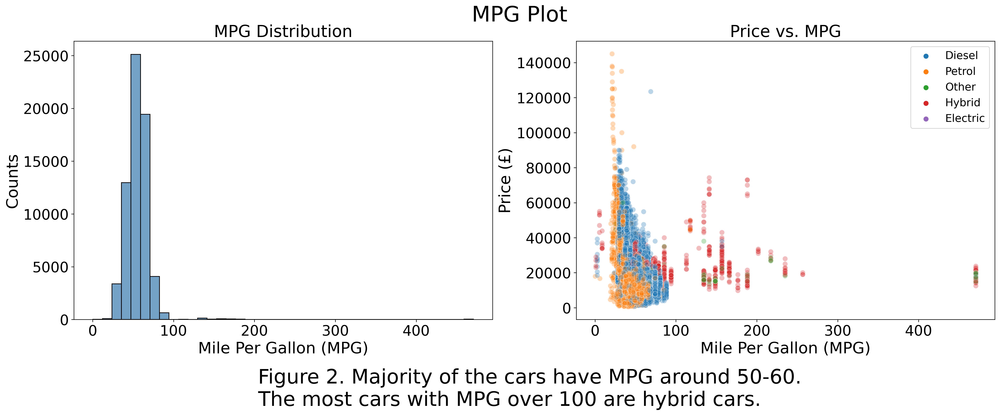

In [657]:
plt.figure(figsize=(23,7),dpi=300)
plt.suptitle('MPG Plot',fontsize=30)

#histogram of mileage
plt.subplot(1,2,1)
sns.histplot(data=car_data, x="mpg",bins=40,color="steelblue")
plt.xlabel('Mile Per Gallon (MPG)',fontsize=22)
plt.ylabel('Counts',fontsize=22)
plt.yticks(fontsize=20)
plt.xticks(fontsize=20)
plt.title('MPG Distribution',fontsize=23)

#MPG vs. price
plt.subplot(1,2,2)
sns.scatterplot(data=car_data, x="mpg", y="price",alpha=0.3,hue="fuelType",s=50)
plt.xlabel('Mile Per Gallon (MPG)',fontsize=22)
plt.ylabel('Price (£)',fontsize=22)
plt.yticks(fontsize=20)
plt.xticks(fontsize=20)
plt.title('Price vs. MPG',fontsize=23)
plt.legend(fontsize=15)
txt="""Figure 2. Majority of the cars have MPG around 50-60. 
The most cars with MPG over 100 are hybrid cars."""
plt.figtext(0.28, -0.12, s=txt, wrap=True, horizontalalignment='left', fontsize=28)
plt.savefig('../figures/MPG plot.png', dpi=300, bbox_inches='tight')
plt.show()



### Tax

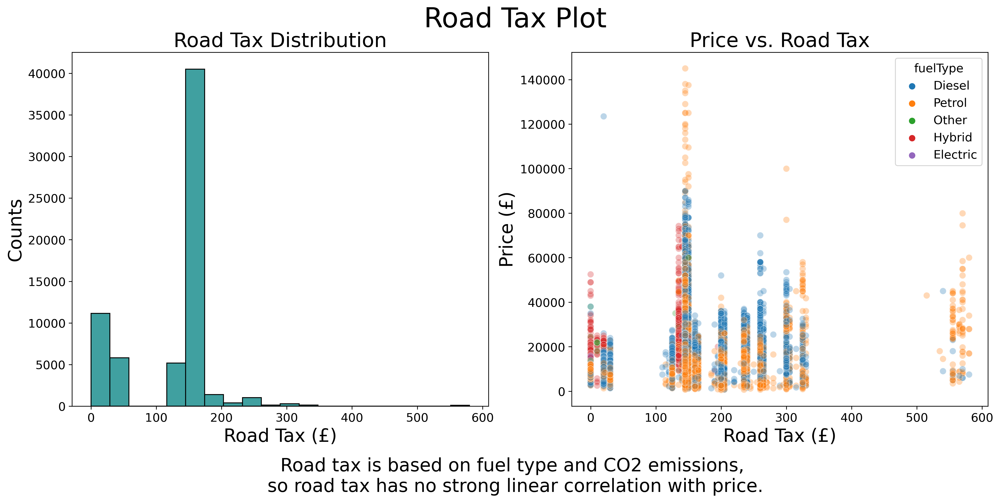

In [561]:
plt.figure(figsize=(18,7),dpi=300)
plt.suptitle('Road Tax Plot',fontsize=30)

#histogram of tax
plt.subplot(1,2,1)
sns.histplot(data=car_data, x="roadTax",bins=20,color="teal")
plt.xlabel('Road Tax (£)',fontsize=20)
plt.ylabel('Counts',fontsize=20)
plt.title('Road Tax Distribution',fontsize=22)


#tax vs. price
plt.subplot(1,2,2)
sns.scatterplot(data=car_data, x="roadTax", y="price",alpha=0.3,s=50,color="seagreen",hue="fuelType")
plt.xlabel('Road Tax (£)',fontsize=20)
plt.ylabel('Price (£)',fontsize=20)
plt.title('Price vs. Road Tax',fontsize=22)
txt="""Road tax is based on fuel type and CO2 emissions, 
so road tax has no strong linear correlation with price."""
plt.figtext(0.5, -0.07, s=txt, wrap=True, horizontalalignment='center', fontsize=20)
plt.savefig('../figures/Road tax plot.jpg', dpi=300, bbox_inches='tight')
plt.show()


### Engine Size

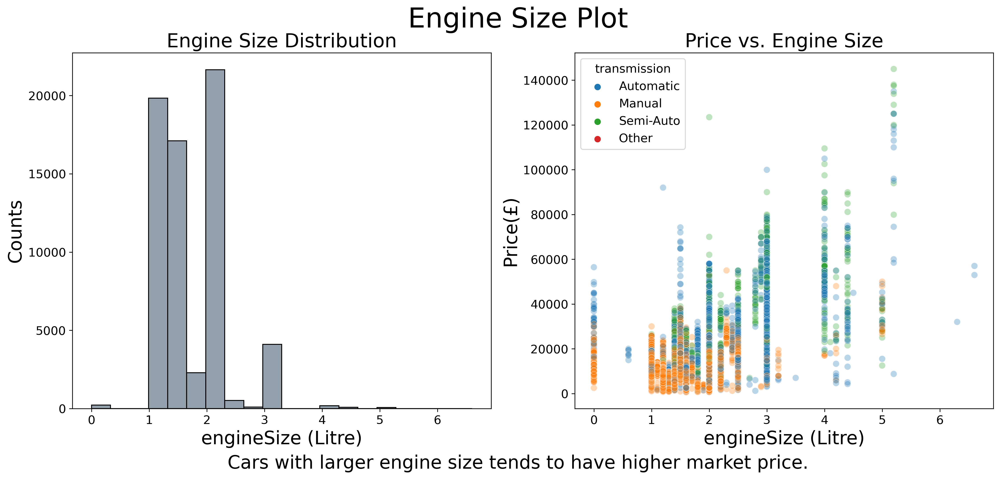

In [562]:
plt.figure(figsize=(18,7),dpi=300)
plt.suptitle('Engine Size Plot',fontsize=30)


#histogram of engineSize
plt.subplot(1,2,1)
sns.histplot(data=car_data, x="engineSize",bins=20,color="slategrey")
plt.xlabel('engineSize (Litre)',fontsize=20)
plt.ylabel('Counts',fontsize=20)
plt.title('Engine Size Distribution',fontsize=21)


#engine size vs. price
plt.subplot(1,2,2)
sns.scatterplot(data=car_data, x="engineSize", y="price",alpha=0.3,s=50,color="seagreen",hue="transmission")
plt.xlabel('engineSize (Litre)',fontsize=20)
plt.ylabel('Price(£)',fontsize=20)
plt.title('Price vs. Engine Size',fontsize=21)
txt="""Cars with larger engine size tends to have higher market price."""
plt.figtext(0.5, -0.02, s=txt, wrap=True, horizontalalignment='center', fontsize=20)
plt.savefig('../figures/Engine size plot.jpg', dpi=300, bbox_inches='tight')
plt.show()



### Correlation Matrix

correlation matrix:
                year     price   mileage   roadTax       mpg  engineSize
year        1.000000  0.523263 -0.748719  0.229192 -0.143413   -0.023332
price       0.523263  1.000000 -0.430451  0.350990 -0.329909    0.630411
mileage    -0.748719 -0.430451  1.000000 -0.221439  0.177621    0.117524
roadTax     0.229192  0.350990 -0.221439  1.000000 -0.427901    0.309274
mpg        -0.143413 -0.329909  0.177621 -0.427901  1.000000   -0.287889
engineSize -0.023332  0.630411  0.117524  0.309274 -0.287889    1.000000
--------------------------------------------------


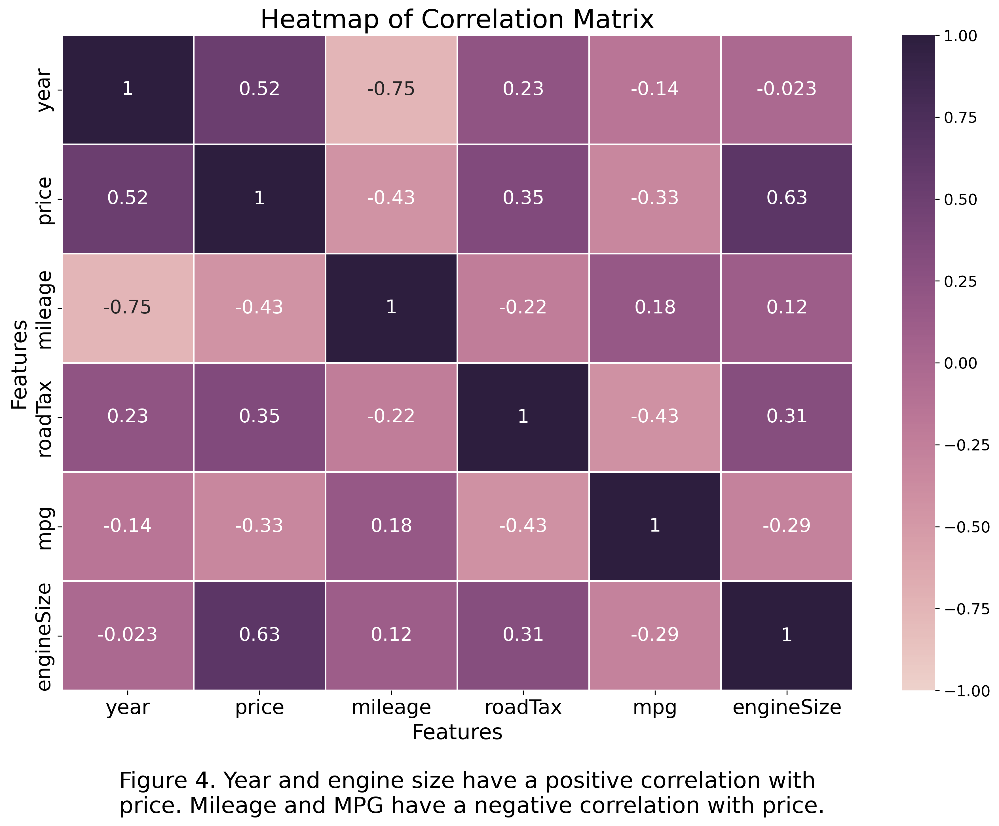

In [668]:
#calculate the Pearson correlation matrix
plt.figure(figsize=(15,10),dpi=300)
cor=car_data.corr(method='pearson')
print("correlation matrix:")
print(cor)
print("-"*50)
# plotting correlation heatmap
dataplot=sns.heatmap(cor,cmap=sns.cubehelix_palette(as_cmap=True),linewidths=1,vmin=-1, vmax=1,annot=True,annot_kws={"size":16})
dataplot.set_yticklabels(dataplot.get_ymajorticklabels(), fontsize = 14)
dataplot.set_xticklabels(dataplot.get_ymajorticklabels(), fontsize = 14)
plt.title('Heatmap of Correlation Matrix', fontsize = 22)
plt.xlabel("Features",fontsize=18)
plt.ylabel("Features",fontsize=18)
plt.yticks(fontsize=17)
plt.xticks(fontsize=17)
txt="""Figure 4. Year and engine size have a positive correlation with 
price. Mileage and MPG have a negative correlation with price."""
plt.figtext(0.17, -0.03, s=txt, wrap=True, horizontalalignment='left', fontsize=19)
plt.savefig('../figures/Heatmap of correlation matrix.png', dpi=300, bbox_inches='tight')
plt.show()

# Split (combined in pipeline below)

In [30]:
# print("total set:",car_data.shape)
# random_state=42
# y = car_data['price'] 
# X = car_data.loc[:, car_data.columns != 'price'] 
# print("-"*30)
# print("Basic Splitting: Train 80%, Val 10%, Test 10%")
# # first split to separate out the training set
# X_train, X_other, y_train, y_other = train_test_split(X,y,train_size = 0.8,shuffle=True,random_state=random_state)
# print('training set:',X_train.shape, y_train.shape) 

# # second split to separate out the validation and test sets
# X_val, X_test, y_val, y_test = train_test_split(X_other,y_other,train_size = 0.5,shuffle=True,random_state=random_state)
# print('validation set:',X_val.shape, y_val.shape) 
# print('test set:',X_test.shape, y_test.shape) 

# print("="*50)
# print('X_train Set')
# print(X_train.head())
# print("-"*30)
# print('y_train Set')
# print(y_train.head())

total set: (66169, 10)
------------------------------
Basic Splitting: Train 80%, Val 10%, Test 10%
training set: (52935, 9) (52935,)
validation set: (6617, 9) (6617,)
test set: (6617, 9) (6617,)
X_train Set
          model  year transmission  mileage fuelType  roadTax   mpg  \
26731        A3  2017       Manual    21113   Petrol      145  55.4   
9293   1 Series  2016       Manual    39779   Diesel        0  83.1   
52258    Fiesta  2016    Automatic    19424   Petrol        0  57.7   
30142        A6  2019    Automatic     5000   Diesel      145  47.9   
32012        Q5  2019    Semi-Auto     6243   Diesel      145  32.5   

       engineSize brand  
26731         1.5  audi  
9293          1.5   bmw  
52258         1.0  ford  
30142         2.0  audi  
32012         3.0  audi  
------------------------------
y_train Set
26731    19998
9293     10599
52258     9190
30142    30000
32012    53945
Name: price, dtype: int64


# Preprocessing (combined in pipeline below)

In [43]:
# # collect which encoder to use on each feature
# onehot_ftrs = ['model','transmission','fuelType',"brand"]
# std_ftrs = ['year','mileage','roadTax','mpg']
# minmax_ftrs = ['engineSize']

# # collect all the encoders
# preprocessor = ColumnTransformer(
#     transformers=[
#         ('onehot', OneHotEncoder(sparse=False,handle_unknown='ignore'), onehot_ftrs),
#         ('std', StandardScaler(), std_ftrs),
#         ('minmax', MinMaxScaler(), minmax_ftrs)],remainder="passthrough")

# clf = Pipeline(steps=[('preprocessor', preprocessor)]) 

# X_train_prep = clf.fit_transform(X_train)
# X_val_prep = clf.transform(X_val)
# X_test_prep = clf.transform(X_test)

# print("origin size of X_train:",X_train.shape)
# print("after preprocessing, size of X_train:",X_train_prep.shape)
# print("=="*50)
# print(X_train_prep)

# #put column names back after preprocessing
# data_column_names = clf.steps[0][1].get_feature_names_out()
# x_train_review=pd.DataFrame(X_train_prep)
# x_train_review.columns =data_column_names
# print(x_train_review)

origin size of X_train: (52935, 9)
after preprocessing, size of X_train: (52935, 153)
[[ 0.          0.          0.         ...  0.43236782 -0.01672104
   0.22727273]
 [ 1.          0.          0.         ... -1.80699256  1.61927776
   0.22727273]
 [ 0.          0.          0.         ... -1.80699256  0.11912001
   0.15151515]
 ...
 [ 0.          0.          0.         ... -1.80699256  0.59161064
   0.15151515]
 [ 0.          0.          0.         ...  0.12349052  0.2608672
   0.3030303 ]
 [ 0.          0.          0.         ...  0.43236782 -1.35150707
   0.3030303 ]]
       onehot__model_1 Series  onehot__model_2 Series  onehot__model_3 Series  \
0                         0.0                     0.0                     0.0   
1                         1.0                     0.0                     0.0   
2                         0.0                     0.0                     0.0   
3                         0.0                     0.0                     0.0   
4                 

# Modeling

In [475]:
onehot_ftrs = ['model','transmission','fuelType',"brand"]
std_ftrs = ['year','mileage','roadTax','mpg']
minmax_ftrs = ['engineSize']

# collect all the encoders
preprocessor = ColumnTransformer(
    transformers=[
        ('onehot', OneHotEncoder(sparse=False,handle_unknown='ignore'), onehot_ftrs),
        ('std', StandardScaler(), std_ftrs),
        ('minmax', MinMaxScaler(), minmax_ftrs)],remainder="passthrough")
prep = Pipeline(steps=[('preprocessor', preprocessor)]) 



In [476]:
from sklearn.model_selection import ParameterGrid
from sklearn.pipeline import make_pipeline
from sklearn.metrics import mean_squared_error
from sklearn.linear_model import Lasso
from sklearn.svm import SVR
import xgboost as xgb
from sklearn.linear_model import Ridge
from sklearn.linear_model import ElasticNet
from sklearn.ensemble import RandomForestRegressor
from sklearn.neighbors import KNeighborsRegressor
from sklearn.metrics import r2_score

def MLpipe_RMSE(ML_algorithm, param_grid):
    nr_states = 5
    RMSE_test_scores = np.zeros(nr_states)
    #r2_test_scores = np.zeros(nr_states)
    final_models = []
    final_models_test_set = []
    final_models_test_set_y = []
    final_models_test_set_pred = []
    baseline_RMSE_test_scores = np.zeros(nr_states)
    baseline_RMSE_test_std = np.zeros(nr_states)

    # loop through the different random states
    for i in range(nr_states):
        print('randoms state '+str(i+1))

        # first split to separate out the training set
        y = car_data['price'] 
        X = car_data.loc[:, car_data.columns != 'price'] 
        X_train, X_other, y_train, y_other = train_test_split(X,y,train_size = 0.8,shuffle=True,random_state=42*i)
        X_val, X_test, y_val, y_test = train_test_split(X_other,y_other,train_size = 0.5,shuffle=True,random_state=42*i)

        X_train_prep = prep.fit_transform(X_train)
        X_val_prep = prep.transform(X_val)
        X_test_prep = prep.transform(X_test)

        train_score = np.zeros(len(ParameterGrid(param_grid)))
        val_score = np.zeros(len(ParameterGrid(param_grid)))
        models = []
        
        #baseline score
        baseline_RMSE_test_scores[i] = np.sqrt(mean_squared_error(y_test, np.full((y_test.shape[0], ), np.mean(y_test), dtype=int)))
        baseline_RMSE_test_std[i] = np.std(y_test,ddof=1)
        print("    Baseline_RMSE_test_Score:",baseline_RMSE_test_scores[i])
        print("    Baseline_RMSE_test_std:",baseline_RMSE_test_std[i])

        # loop through all combinations of hyperparameter combos
        for p in range(len(ParameterGrid(param_grid))):
            params = ParameterGrid(param_grid)[p]
            #print('   ',params) 
            if ML_algorithm in [KNeighborsRegressor]:
                clf = ML_algorithm(**params)
            else:
                clf = ML_algorithm(**params,random_state = 42*i)
            if ML_algorithm in [xgb.XGBRegressor]:
                clf.fit(X_train_prep,y_train,eval_set=[(X_val_prep, y_val)], eval_metric='rmse',early_stopping_rounds=50,verbose=False)
            else: 
                clf.fit(X_train_prep,y_train) # fit the model
            models.append(clf) # save it
            # calculate train and validation Root Mean Square Error scores
            y_train_pred = clf.predict(X_train_prep)
            train_score[p] = np.sqrt(mean_squared_error(y_train,y_train_pred))
            y_val_pred = clf.predict(X_val_prep)
            val_score[p] = np.sqrt(mean_squared_error(y_val,y_val_pred))
            #print('   ',train_score[p],val_score[p])
        
        # print out model parameters that minimize validation Root Mean Square Error
        print('    best model parameters:',ParameterGrid(param_grid)[np.argmin(val_score)])
        print('    corresponding validation score:',np.min(val_score))
        # collect and save the best model and corresponding test set
        final_models.append(models[np.argmin(val_score)])
        final_models_test_set_y.append(y_test)
        final_models_test_set.append(pd.DataFrame(X_test_prep,columns=prep.get_feature_names_out()))
        # calculate and save the test score
        y_test_pred = final_models[-1].predict(X_test_prep)
        final_models_test_set_pred.append(y_test_pred)
        RMSE_test_scores[i] = np.sqrt(mean_squared_error(y_test,y_test_pred))
        print('    RMSE_test_score:',RMSE_test_scores[i])
#         r2_test_scores[i] = r2_score(y_test,y_test_pred)
#         print('r2_test_score:',r2_test_scores[i])
    
    # print out mean and std of test scores
    print('='*50)
    print('mean of RMSE test scores:',np.mean(RMSE_test_scores))
    print('standard deviation of RMSE test scores:',np.std(RMSE_test_scores,ddof=1))
    print('mean of baseline RMSE is:',np.mean(baseline_RMSE_test_scores))
    print('the result is {:.4} standard deviations above baseline'.format((np.mean(RMSE_test_scores)-np.mean(baseline_RMSE_test_scores))/(np.std(RMSE_test_scores,ddof=1))))
    
    best_final_models=final_models[np.argmin(RMSE_test_scores)]
    best_final_models_test_set=final_models_test_set[np.argmin(RMSE_test_scores)]
    best_final_models_test_set_y=final_models_test_set_y[np.argmin(RMSE_test_scores)]
    best_final_models_test_set_pred=final_models_test_set_pred[np.argmin(RMSE_test_scores)]
    best_RMSE_test_scores=RMSE_test_scores[np.argmin(RMSE_test_scores)]
    mean_RMSE=np.mean(RMSE_test_scores)
    std_RMSE=np.std(RMSE_test_scores,ddof=1)
    return(best_final_models,
           best_final_models_test_set,
           best_final_models_test_set_y,
           best_final_models_test_set_pred,
           best_RMSE_test_scores,
           mean_RMSE,
           std_RMSE)
#     print('mean of r2 test scores:',np.mean(r2_test_scores))
#     print('standard deviation of r2 test scores:',np.std(r2_test_scores,ddof=1))
    

## Lasso

In [444]:
ML_algorithm=Lasso
param_grid={'alpha': np.logspace(-3,3,7),'max_iter':[1000]} 
lasso_best_model,lasso_best_testset,lasso_best_testset_y,lasso_best_testset_pred,lasso_best_RMSE,lasso_mean_RMSE,lasso_std_RMSE= MLpipe_RMSE(ML_algorithm, param_grid)

#save the result
file = open('../results/results_lasso.save', 'wb')
pickle.dump((lasso_best_model,lasso_best_testset,lasso_best_testset_y,lasso_best_testset_pred,lasso_best_RMSE,lasso_mean_RMSE,lasso_std_RMSE),file)
file.close()

randoms state 1
    Baseline_RMSE_test_Score: 9425.649754413855
    Baseline_RMSE_test_std: 9426.362018944605
    best model parameters: {'max_iter': 1000, 'alpha': 0.1}
    corresponding validation score: 3067.3780359746984
    RMSE_test_score: 3162.6021251825823
randoms state 2
    Baseline_RMSE_test_Score: 9415.991906062472
    Baseline_RMSE_test_std: 9416.703480732514
    best model parameters: {'max_iter': 1000, 'alpha': 0.1}
    corresponding validation score: 3470.2061032086262
    RMSE_test_score: 3168.3745226938245
randoms state 3
    Baseline_RMSE_test_Score: 9142.565476573083
    Baseline_RMSE_test_std: 9143.25635813402
    best model parameters: {'max_iter': 1000, 'alpha': 0.001}
    corresponding validation score: 3161.356680471178
    RMSE_test_score: 3070.828717134708
randoms state 4
    Baseline_RMSE_test_Score: 9185.496622784944
    Baseline_RMSE_test_std: 9186.1907795835
    best model parameters: {'max_iter': 1000, 'alpha': 0.1}
    corresponding validation score: 34

## Ridge

In [442]:
ML_algorithm=Ridge
param_grid={'alpha': np.logspace(-3,3,7),'max_iter':[1000]} 
ridge_best_model,ridge_best_testset,ridge_best_testset_y,ridge_best_testset_pred,ridge_best_RMSE,ridge_mean_RMSE,ridge_std_RMSE = MLpipe_RMSE(ML_algorithm, param_grid)

#save the result
file = open('../results/results_ridge.save', 'wb')
pickle.dump((ridge_best_model,ridge_best_testset,ridge_best_testset_y,ridge_best_testset_pred,ridge_best_RMSE,ridge_mean_RMSE,ridge_std_RMSE),file)
file.close()

randoms state 1
    Baseline_RMSE_test_Score: 9425.649754413855
    Baseline_RMSE_test_std: 9426.362018944605
    best model parameters: {'max_iter': 1000, 'alpha': 10.0}
    corresponding validation score: 3054.3511876072253
    RMSE_test_score: 3208.0372978003097
randoms state 2
    Baseline_RMSE_test_Score: 9415.991906062472
    Baseline_RMSE_test_std: 9416.703480732514
    best model parameters: {'max_iter': 1000, 'alpha': 1.0}
    corresponding validation score: 3466.684322383905
    RMSE_test_score: 3169.8235014921192
randoms state 3
    Baseline_RMSE_test_Score: 9142.565476573083
    Baseline_RMSE_test_std: 9143.25635813402
    best model parameters: {'max_iter': 1000, 'alpha': 0.001}
    corresponding validation score: 3161.3611789451234
    RMSE_test_score: 3070.8172468060193
randoms state 4
    Baseline_RMSE_test_Score: 9185.496622784944
    Baseline_RMSE_test_std: 9186.1907795835
    best model parameters: {'max_iter': 1000, 'alpha': 1.0}
    corresponding validation score: 

## Random forest

In [443]:
ML_algorithm=RandomForestRegressor
param_grid = {'max_depth': [1, 3, 10, 30, 100, 300], 
            'max_features': [0.25, 0.5, 0.75, 1.0],} 
rf_best_model,rf_best_testset,rf_best_testset_y,rf_best_testset_pred,rf_best_RMSE,rf_mean_RMSE,rf_std_RMSE = MLpipe_RMSE(ML_algorithm, param_grid)

#save the result
file = open('../results/results_rf.save', 'wb')
pickle.dump((rf_best_model,rf_best_testset,rf_best_testset_y,rf_best_testset_pred,rf_best_RMSE,rf_mean_RMSE,rf_std_RMSE),file)
file.close()

randoms state 1
    Baseline_RMSE_test_Score: 9425.649754413855
    Baseline_RMSE_test_std: 9426.362018944605
    best model parameters: {'max_features': 0.25, 'max_depth': 30}
    corresponding validation score: 1636.0268511906554
    RMSE_test_score: 1766.8022167268666
randoms state 2
    Baseline_RMSE_test_Score: 9415.991906062472
    Baseline_RMSE_test_std: 9416.703480732514
    best model parameters: {'max_features': 0.5, 'max_depth': 30}
    corresponding validation score: 2200.7097397316534
    RMSE_test_score: 1666.790879477011
randoms state 3
    Baseline_RMSE_test_Score: 9142.565476573083
    Baseline_RMSE_test_std: 9143.25635813402
    best model parameters: {'max_features': 0.25, 'max_depth': 100}
    corresponding validation score: 1764.844582864824
    RMSE_test_score: 1718.360398995982
randoms state 4
    Baseline_RMSE_test_Score: 9185.496622784944
    Baseline_RMSE_test_std: 9186.1907795835
    best model parameters: {'max_features': 0.5, 'max_depth': 100}
    correspon

## K-nearest Neighbors

In [445]:
ML_algorithm=KNeighborsRegressor
param_grid = {'n_neighbors':np.linspace(1,500,5,dtype=int),
                 'weights':["uniform", "distance"] } 
knn_best_model,knn_best_testset,knn_best_testset_y,knn_best_testset_pred,knn_best_RMSE,knn_mean_RMSE,knn_std_RMSE = MLpipe_RMSE(ML_algorithm, param_grid)

#save the result
file = open('../results/results_knn.save', 'wb')
pickle.dump((knn_best_model,knn_best_testset,knn_best_testset_y,knn_best_testset_pred,knn_best_RMSE,knn_mean_RMSE,knn_std_RMSE),file)
file.close()

randoms state 1
    Baseline_RMSE_test_Score: 9425.649754413855
    Baseline_RMSE_test_std: 9426.362018944605
    best model parameters: {'weights': 'distance', 'n_neighbors': 125}
    corresponding validation score: 2375.95636257739
    RMSE_test_score: 2533.3430379961605
randoms state 2
    Baseline_RMSE_test_Score: 9415.991906062472
    Baseline_RMSE_test_std: 9416.703480732514
    best model parameters: {'weights': 'uniform', 'n_neighbors': 1}
    corresponding validation score: 2633.7427418285374
    RMSE_test_score: 2182.2723303133366
randoms state 3
    Baseline_RMSE_test_Score: 9142.565476573083
    Baseline_RMSE_test_std: 9143.25635813402
    best model parameters: {'weights': 'uniform', 'n_neighbors': 1}
    corresponding validation score: 2279.4657396048624
    RMSE_test_score: 2470.6470670102726
randoms state 4
    Baseline_RMSE_test_Score: 9185.496622784944
    Baseline_RMSE_test_std: 9186.1907795835
    best model parameters: {'weights': 'uniform', 'n_neighbors': 1}
    c

## XGBboost

In [477]:
ML_algorithm=xgb.XGBRegressor
param_grid = {"learning_rate": [0.05],
                  "n_estimators": [10000],
                  "missing": [np.nan], 
                  "max_depth": [1,3,10,30,100],
                  "colsample_bytree": [0.9],   
                  "subsample": [0.66],
             }

xgb_best_model,xgb_best_testset,xgb_best_testset_y,xgb_best_testset_pred,xgb_best_RMSE,xgb_mean_RMSE,xgb_std_RMSE = MLpipe_RMSE(ML_algorithm, param_grid)

#save the result
file = open('../results/results_xgb.save', 'wb')
pickle.dump((xgb_best_model,xgb_best_testset,xgb_best_testset_y,xgb_best_testset_pred,xgb_best_RMSE,xgb_mean_RMSE,xgb_std_RMSE),file)
file.close()

randoms state 1
    Baseline_RMSE_test_Score: 9425.649754413855
    Baseline_RMSE_test_std: 9426.362018944605
    best model parameters: {'subsample': 0.66, 'n_estimators': 10000, 'missing': nan, 'max_depth': 10, 'learning_rate': 0.05, 'colsample_bytree': 0.9}
    corresponding validation score: 1543.9950838808786
    RMSE_test_score: 1667.9128088091356
randoms state 2
    Baseline_RMSE_test_Score: 9415.991906062472
    Baseline_RMSE_test_std: 9416.703480732514
    best model parameters: {'subsample': 0.66, 'n_estimators': 10000, 'missing': nan, 'max_depth': 10, 'learning_rate': 0.05, 'colsample_bytree': 0.9}
    corresponding validation score: 2123.1456780706576
    RMSE_test_score: 1576.917441070183
randoms state 3
    Baseline_RMSE_test_Score: 9142.565476573083
    Baseline_RMSE_test_std: 9143.25635813402
    best model parameters: {'subsample': 0.66, 'n_estimators': 10000, 'missing': nan, 'max_depth': 30, 'learning_rate': 0.05, 'colsample_bytree': 0.9}
    corresponding validation 

## Read saved model files

In [164]:
#read saved results

# lasso
file_lasso = open('../results/results_lasso.save', 'rb')
lasso_best_model,lasso_best_testset,lasso_best_testset_y,lasso_best_testset_pred,lasso_best_RMSE = pickle.load(file_lasso)
file_lasso.close()

# ridge
file_ridge = open('../results/results_ridge.save', 'rb')
ridge_best_model,ridge_best_testset,ridge_best_testset_y,ridge_best_testset_pred,ridge_best_RMSE = pickle.load(file_ridge)
file_ridge.close()

# random forest
file_rf = open('../results/results_rf.save', 'rb')
rf_best_model,rf_best_testset,rf_best_testset_y,rf_best_testset_pred,rf_best_RMSE = pickle.load(file_rf)
file_rf.close()

#knn
file_knn = open('../results/results_knn.save', 'rb')
knn_best_model,knn_best_testset,knn_best_testset_y,knn_best_testset_pred,knn_best_RMSE = pickle.load(file_knn)
file_knn.close()

#xgboost
file_xgb = open('../results/results_xgb.save', 'rb')
xgb_best_model,xgb_best_testset,xgb_best_testset_y,xgb_best_testset_pred,xgb_best_RMSE = pickle.load(file_xgb)
file_xgb.close()

# Measure the uncertainties

## Uncertainties due to splitting

In [478]:
uncertainties=pd.DataFrame({"model":["lasso","ridge","random_forest","k_neighbors","xgboost"],
                    "mean":[lasso_mean_RMSE,ridge_mean_RMSE,rf_mean_RMSE,knn_mean_RMSE,xgb_mean_RMSE],
                    "std":[lasso_std_RMSE,ridge_std_RMSE,rf_std_RMSE,knn_std_RMSE,xgb_std_RMSE]})
print("uncertainties from splitting:")
print(uncertainties)

uncertainties from splitting:
           model         mean         std
0          lasso  3182.448782  114.115111
1          ridge  3189.628196  109.518001
2  random_forest  1793.223760  157.228207
3    k_neighbors  2404.349622  183.337602
4        xgboost  1717.535408  167.924418


## Uncertainties due to non-deterministic models

## Same random state for runing multiple times to measure uncertainty from the model itself

In [479]:
def MLpipe_RMSE_uncertainties(ML_algorithm, param_grid):
    nr_states = 5
    RMSE_test_scores = np.zeros(nr_states)
    r2_test_scores = np.zeros(nr_states)
    final_models = []
    final_models_test_set = []
    final_models_test_set_y = []
    final_models_test_set_pred = []
    baseline_RMSE_test_scores = np.zeros(nr_states)
    baseline_RMSE_test_std = np.zeros(nr_states)
    
    print("Same random state for runing 5 times to measure uncertainty from the model itself:")
    # loop through the different random states
    for i in range(0,nr_states):
        print("{}th time running".format(i+1))

        # first split to separate out the training set
        y = car_data['price'] 
        X = car_data.loc[:, car_data.columns != 'price'] 
        X_train, X_other, y_train, y_other = train_test_split(X,y,train_size = 0.8,shuffle=True,random_state=42)
        X_val, X_test, y_val, y_test = train_test_split(X_other,y_other,train_size = 0.5,shuffle=True,random_state=42)

        X_train_prep = prep.fit_transform(X_train)
        X_val_prep = prep.transform(X_val)
        X_test_prep = prep.transform(X_test)

        train_score = np.zeros(len(ParameterGrid(param_grid)))
        val_score = np.zeros(len(ParameterGrid(param_grid)))
        models = []
        
        #baseline score
        baseline_RMSE_test_scores[i] = np.sqrt(mean_squared_error(y_test, np.full((y_test.shape[0], ), np.mean(y_test), dtype=int)))
        baseline_RMSE_test_std[i] = np.std(y_test,ddof=1)
        #print("    Baseline_RMSE_test_Score:",baseline_RMSE_test_scores[i])
        #print("    Baseline_RMSE_test_std:",baseline_RMSE_test_std[i])

        # loop through all combinations of hyperparameter combos
        for p in range(len(ParameterGrid(param_grid))):
            params = ParameterGrid(param_grid)[p]
            #print('   ',params) 
            clf = ML_algorithm(**params)
            if ML_algorithm in [xgb.XGBRegressor]:
                clf.fit(X_train_prep,y_train,eval_set=[(X_val_prep, y_val)], eval_metric='rmse',early_stopping_rounds=50,verbose=False)
            else: 
                clf.fit(X_train_prep,y_train) # fit the model
            models.append(clf) # save it
            # calculate train and validation Root Mean Square Error scores
            y_train_pred = clf.predict(X_train_prep)
            train_score[p] = np.sqrt(mean_squared_error(y_train,y_train_pred))
            y_val_pred = clf.predict(X_val_prep)
            val_score[p] = np.sqrt(mean_squared_error(y_val,y_val_pred))
            #print('   ',train_score[p],val_score[p])
        
        # print out model parameters that minimize validation Root Mean Square Error
        #print('    best model parameters:',ParameterGrid(param_grid)[np.argmin(val_score)])
        #print('    corresponding validation score:',np.min(val_score))
        # collect and save the best model and corresponding test set
        final_models.append(models[np.argmin(val_score)])
        final_models_test_set_y.append(y_test)
        final_models_test_set.append(pd.DataFrame(X_test_prep,columns=prep.get_feature_names_out()))
        # calculate and save the test score
        y_test_pred = final_models[-1].predict(X_test_prep)
        final_models_test_set_pred.append(y_test_pred)
        RMSE_test_scores[i] = np.sqrt(mean_squared_error(y_test,y_test_pred))
        print('    RMSE_test_score:',RMSE_test_scores[i])
        
    
    mean_RMSE=np.mean(RMSE_test_scores)
    std_RMSE=np.std(RMSE_test_scores,ddof=1)
    # print out mean and std of test scores
    print('='*50)
    print('mean of RMSE test scores:',np.mean(RMSE_test_scores))
    print('standard deviation of RMSE test scores:',np.std(RMSE_test_scores,ddof=1))
    print('baseline RMSE is:',np.mean(baseline_RMSE_test_scores))
        
    return(mean_RMSE,std_RMSE)
#     print('mean of r2 test scores:',np.mean(r2_test_scores))
#     print('standard deviation of r2 test scores:',np.std(r2_test_scores,ddof=1))
    

In [480]:
ML_algorithm=Lasso
param_grid={'alpha':[1],'max_iter':[1000]} 
uncertainty_lasso_mean_RMSE,uncertainty_lasso_std_RMSE= MLpipe_RMSE_uncertainties(ML_algorithm, param_grid)


Same random state for runing 5 times to measure uncertainty from the model itself:
1th time running
    RMSE_test_score: 3199.656151048722
2th time running
    RMSE_test_score: 3199.656151048722
3th time running
    RMSE_test_score: 3199.656151048722
4th time running
    RMSE_test_score: 3199.656151048722
5th time running
    RMSE_test_score: 3199.656151048722
mean of RMSE test scores: 3199.656151048722
standard deviation of RMSE test scores: 0.0
baseline RMSE is: 9415.991906062472


In [481]:
ML_algorithm=Ridge
param_grid={'alpha':[1],'max_iter':[1000]} 
uncertainty_ridge_mean_RMSE,uncertainty_ridge_std_RMSE = MLpipe_RMSE_uncertainties(ML_algorithm, param_grid)

Same random state for runing 5 times to measure uncertainty from the model itself:
1th time running
    RMSE_test_score: 3169.8235014921192
2th time running
    RMSE_test_score: 3169.8235014921192
3th time running
    RMSE_test_score: 3169.8235014921192
4th time running
    RMSE_test_score: 3169.8235014921192
5th time running
    RMSE_test_score: 3169.8235014921192
mean of RMSE test scores: 3169.8235014921192
standard deviation of RMSE test scores: 0.0
baseline RMSE is: 9415.991906062472


In [482]:
ML_algorithm=RandomForestRegressor
param_grid = {'max_depth': [30], 
            'max_features': [0.5]} 
uncertainty_rf_mean_RMSE,uncertainty_rf_std_RMSE = MLpipe_RMSE_uncertainties(ML_algorithm, param_grid)

Same random state for runing 5 times to measure uncertainty from the model itself:
1th time running
    RMSE_test_score: 1660.5216317677402
2th time running
    RMSE_test_score: 1663.7600240564389
3th time running
    RMSE_test_score: 1656.5862962736985
4th time running
    RMSE_test_score: 1663.095563614293
5th time running
    RMSE_test_score: 1664.6727401759108
mean of RMSE test scores: 1661.7272511776162
standard deviation of RMSE test scores: 3.2620271851220446
baseline RMSE is: 9415.991906062472


In [483]:
ML_algorithm=KNeighborsRegressor
param_grid = {'n_neighbors':[1],
                 'weights':["uniform"] } 
uncertainty_knn_mean_RMSE,uncertainty_knn_std_RMSE = MLpipe_RMSE_uncertainties(ML_algorithm, param_grid)

Same random state for runing 5 times to measure uncertainty from the model itself:
1th time running
    RMSE_test_score: 2182.2723303133366
2th time running
    RMSE_test_score: 2182.2723303133366
3th time running
    RMSE_test_score: 2182.2723303133366
4th time running
    RMSE_test_score: 2182.2723303133366
5th time running
    RMSE_test_score: 2182.2723303133366
mean of RMSE test scores: 2182.2723303133366
standard deviation of RMSE test scores: 0.0
baseline RMSE is: 9415.991906062472


In [484]:
ML_algorithm=xgb.XGBRegressor
param_grid = {"learning_rate": [0.05],
                  "n_estimators": [10000],
                  "missing": [np.nan], 
                  "max_depth": [10],
                  "colsample_bytree": [0.9],   
                  "subsample": [0.66],
             }
uncertainty_xgb_mean_RMSE,uncertainty_xgb_std_RMSE = MLpipe_RMSE_uncertainties(ML_algorithm, param_grid)

Same random state for runing 5 times to measure uncertainty from the model itself:
1th time running
    RMSE_test_score: 1562.377348879858
2th time running
    RMSE_test_score: 1562.377348879858
3th time running
    RMSE_test_score: 1562.377348879858
4th time running
    RMSE_test_score: 1562.377348879858
5th time running
    RMSE_test_score: 1562.377348879858
mean of RMSE test scores: 1562.377348879858
standard deviation of RMSE test scores: 0.0
baseline RMSE is: 9415.991906062472


In [485]:
uncertainties_deterministic=pd.DataFrame({"model":["lasso","ridge","random_forest","xgboost","k_neighbors"],
                    "mean":[uncertainty_lasso_mean_RMSE,uncertainty_ridge_mean_RMSE,uncertainty_rf_mean_RMSE,uncertainty_xgb_mean_RMSE,uncertainty_knn_mean_RMSE],
                    "std":[uncertainty_lasso_std_RMSE,uncertainty_ridge_std_RMSE,uncertainty_rf_std_RMSE,uncertainty_xgb_std_RMSE,uncertainty_knn_std_RMSE]})

print("uncertainties from non-deterministic model:")
print(uncertainties_deterministic)

uncertainties from non-deterministic model:
           model         mean       std
0          lasso  3199.656151  0.000000
1          ridge  3169.823501  0.000000
2  random_forest  1661.727251  3.262027
3        xgboost  1562.377349  0.000000
4    k_neighbors  2182.272330  0.000000


uncertainties from splitting:
           model         mean         std
0          lasso  3182.448782  114.115111
1          ridge  3189.628196  109.518001
2  random_forest  1793.223760  157.228207
3        xgboost  1717.535408  167.924418
4    k_neighbors  2404.349622  183.337602
uncertainties from non-deterministic model:
           model         mean       std
0          lasso  3199.656151  0.000000
1          ridge  3169.823501  0.000000
2  random_forest  1661.727251  3.262027
3        xgboost  1562.377349  0.000000
4    k_neighbors  2182.272330  0.000000


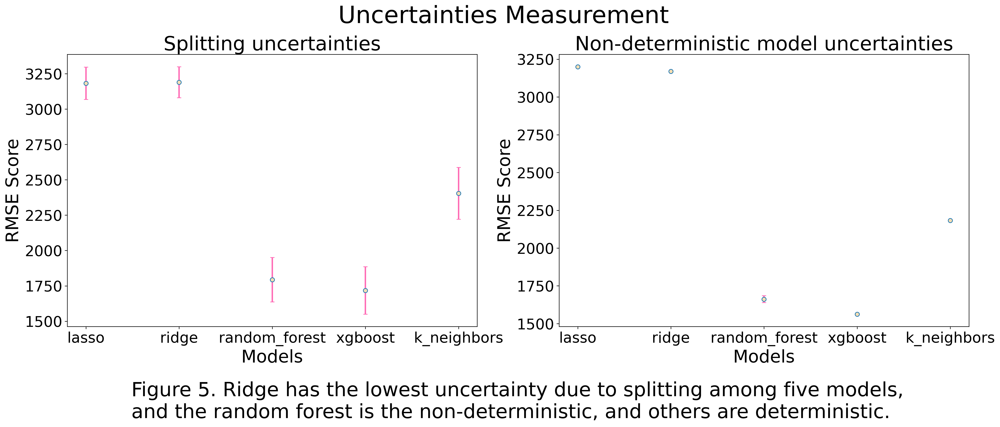

In [665]:
plt.figure(figsize=(23,7),dpi=300)
plt.suptitle('Uncertainties Measurement',fontsize=34, y=1.02)


#histogram of engineSize
plt.subplot(1,2,1)
uncertainties=pd.DataFrame({"model":["lasso","ridge","random_forest","xgboost","k_neighbors"],
                    "mean":[lasso_mean_RMSE,ridge_mean_RMSE,rf_mean_RMSE,xgb_mean_RMSE,knn_mean_RMSE],
                    "std":[lasso_std_RMSE,ridge_std_RMSE,rf_std_RMSE,xgb_std_RMSE,knn_std_RMSE]})

print("uncertainties from splitting:")
print(uncertainties)
print("="*50)
plt.errorbar(uncertainties['model'], uncertainties['mean'], yerr=uncertainties['std'],ecolor="hotpink",fmt="o",elinewidth=2,mfc="wheat",capsize=3)
#plt.axhline(y = 9340.2173, color = 'r', linestyle = '-',label="Baseline Score")
plt.xlabel('Models',fontsize=25)
plt.ylabel("RMSE Score",fontsize=25)
plt.yticks(fontsize=21)
plt.xticks(fontsize=21)
plt.title("Splitting uncertainties",fontsize=28)

#engine size vs. price
plt.subplot(1,2,2)
uncertainties_deterministic=pd.DataFrame({"model":["lasso","ridge","random_forest","xgboost","k_neighbors"],
                    "mean":[uncertainty_lasso_mean_RMSE,uncertainty_ridge_mean_RMSE,uncertainty_rf_mean_RMSE,uncertainty_xgb_mean_RMSE,uncertainty_knn_mean_RMSE],
                    "std":[uncertainty_lasso_std_RMSE,uncertainty_ridge_std_RMSE,uncertainty_rf_std_RMSE,uncertainty_xgb_std_RMSE,uncertainty_knn_std_RMSE]})

print("uncertainties from non-deterministic model:")
print(uncertainties_deterministic)
plt.errorbar(uncertainties_deterministic['model'], uncertainties_deterministic['mean'], yerr=uncertainties_deterministic['std']*7,ecolor="hotpink",fmt="o",elinewidth=2,mfc="wheat",capsize=3)
#plt.axhline(y = 9340.2173, color = 'r', linestyle = '-',label="Baseline Score")
plt.xlabel('Models',fontsize=25)
plt.ylabel("RMSE Score",fontsize=25)
plt.yticks(fontsize=21)
plt.xticks(fontsize=21)
plt.title("Non-deterministic model uncertainties",fontsize=28)


txt="""Figure 5. Ridge has the lowest uncertainty due to splitting among five models,
and the random forest is the non-deterministic, and others are deterministic."""
plt.figtext(0.18, -0.14, s=txt, wrap=True, horizontalalignment='left', fontsize=28)
plt.savefig('../figures/Uncertainties measurement.png', dpi=300, bbox_inches='tight')
plt.show()


# Scatter plot of the true vs predicted values

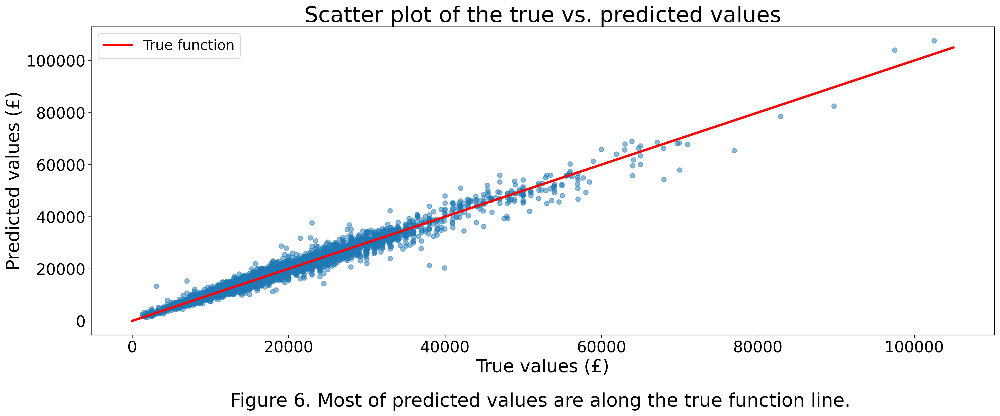

In [649]:
y_test = xgb_best_testset_y
y_test_pred = xgb_best_testset_pred
df_test = xgb_best_testset
temp = df_test.copy()
temp['true_value']=y_test.to_numpy()
temp['predicted_value']=y_test_pred

def line(x):
    return x
x = np.linspace(0, 105000, 1000)

plt.figure(figsize=(18,7),dpi=300)
plt.scatter(temp['true_value'], temp['predicted_value'], alpha=0.5)
plt.plot(x, line(x),color="red",label="True function",linewidth=3);
#plt.scatter(temp['std__mpg'], temp['predicted_value'], alpha=0.5)
plt.title("Scatter plot of the true vs. predicted values", fontsize=28)
plt.xlabel('True values (£)', fontsize=23)
plt.ylabel('Predicted values (£)', fontsize=23)
plt.yticks(fontsize=20)
plt.xticks(fontsize=20)
plt.legend(fontsize=18)
txt="""Figure 6. Most of predicted values are along the true function line."""
plt.figtext(0.54, -0.05, s=txt, wrap=True, horizontalalignment='center', fontsize=24)
plt.savefig('../figures/Scatter plot of the true vs. predicted values.png', dpi=300, bbox_inches='tight')
plt.tight_layout()
plt.show()


# Feature Importance

## Global Feature Importance

### Permutation

In [608]:
#print(best_model,best_testset,best_testset_y,best_testset_pred,best_RMSE)

best_model = xgb_best_model
df_test = xgb_best_testset
y_test = xgb_best_testset_y
y_test_pred = xgb_best_testset_pred
feature_names = xgb_best_testset.columns
#np.random.seed(42)

nr_runs = 10
scores = np.zeros([len(feature_names),nr_runs])

RMSE = np.sqrt(mean_squared_error(y_test,y_test_pred))
RMSE_baseline = np.sqrt(mean_squared_error(y_test, np.full((y_test.shape[0], ), np.mean(y_test), dtype=int)))
R2 = r2_score(y_test,y_test_pred)
R2_baseline = r2_score(y_test,np.full((len(y_test),),np.mean(y_test_pred)))
test_score = RMSE
print('test score = ',test_score)
print('test baseline = ',RMSE_baseline)
# loop through the features
for i in range(len(feature_names)):
    #print('shuffling '+str(feature_names[i]))
    acc_scores = []
    for j in range(nr_runs):
        X_test_shuffled = df_test.copy()
        X_test_shuffled[feature_names[i]] = np.random.permutation(df_test[feature_names[i]].values)
        acc_scores.append(np.sqrt(mean_squared_error(y_test,best_model.predict(X_test_shuffled.to_numpy()))))
    #print('   shuffled test score:',np.around(np.mean(acc_scores),3),'+/-',np.around(np.std(acc_scores),3))
    scores[i] = acc_scores

test score =  1576.917441070183
test baseline =  9415.991906062472


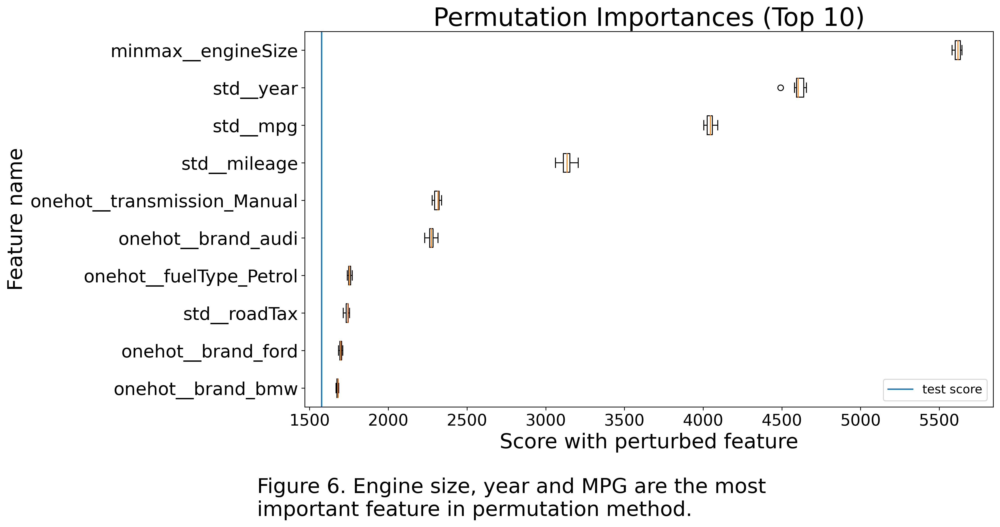

In [619]:
plt.figure(figsize=(15,7),dpi=300)
sorted_indcs = np.argsort(np.mean(scores,axis=1))[::-1][:10][::-1]
plt.rcParams.update({'font.size': 13})
plt.boxplot(scores[sorted_indcs].T,labels=feature_names[sorted_indcs],vert=False)
plt.axvline(test_score,label='test score')
plt.title("Permutation Importances (Top 10)", fontsize=27)
plt.xlabel('Score with perturbed feature', fontsize=22)
plt.ylabel('Feature name', fontsize=22)
plt.yticks(fontsize=19)
plt.xticks(fontsize=17)
txt="""Figure 6. Engine size, year and MPG are the most 
important feature in permutation method."""
plt.figtext(0.26, -0.1, s=txt, wrap=True, horizontalalignment='left', fontsize=22)
plt.savefig('../figures/Top10_permutation_Feature_Importance.png', dpi=300, bbox_inches='tight')
plt.legend()
plt.tight_layout()
plt.show()

In [610]:
sorted_indcs = np.argsort(np.mean(scores,axis=1))[0]
print("="*50)
print("Least importance feature is:",feature_names[sorted_indcs])                                                

Least importance feature is: onehot__model_Z4


### SHAP

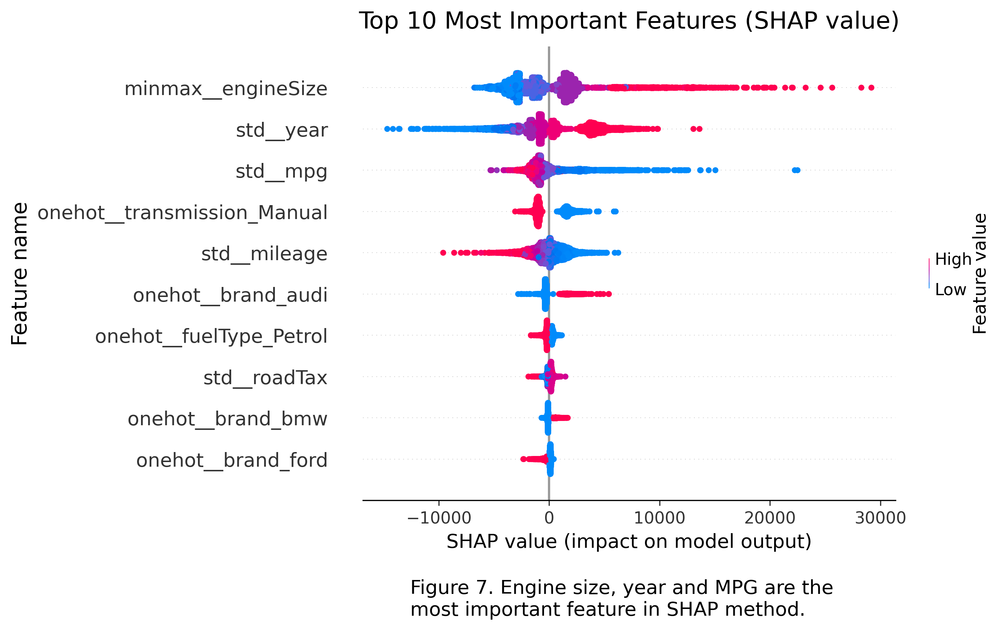

In [667]:
import shap
# load JS visualization code to notebook
plt.figure(figsize=(15,7),dpi=300)
shap.initjs()
explainer = shap.TreeExplainer(best_model)
shap_values = explainer.shap_values(df_test)
shap.summary_plot(shap_values, features=df_test, feature_names=df_test.columns,max_display=10, show=False)
plt.title("Top 10 Most Important Features (SHAP value)",fontsize=16,y=1.02)
plt.ylabel('Feature name', fontsize=14)
txt="""Figure 7. Engine size, year and MPG are the 
most important feature in SHAP method."""
plt.figtext(0.18, -0.08, s=txt, wrap=True, horizontalalignment='left', fontsize=13)
plt.savefig('../figures/Top10_SHAP_Feature_Importance.png', dpi=300, bbox_inches='tight')
plt.show()

In [44]:
result_shap = pd.DataFrame(shap_values,columns=df_test.columns)
#print((result_shap.abs().describe().iloc[1]).sort_values())
importance_shap = ((result_shap.abs().describe().iloc[1]).sort_values())
print("="*50)
print("Least importance feature is:",importance_shap.index[0])

Least importance feature is: onehot__model_Eos


### Total Gain

top 10 most important features:
onehot__brand_ford             1.170775e+11
onehot__fuelType_Petrol        1.542691e+11
onehot__brand_audi             3.702137e+11
onehot__model_R8               4.288939e+11
std__roadTax                   5.181994e+11
std__mileage                   1.781568e+12
onehot__transmission_Manual    2.203774e+12
std__mpg                       3.964254e+12
std__year                      9.405745e+12
minmax__engineSize             1.064935e+13
Name: 0, dtype: float64


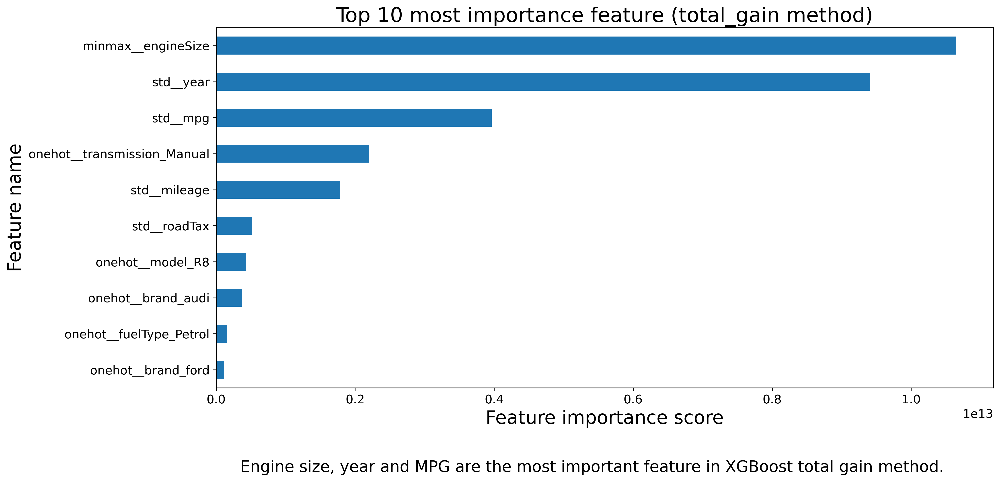

In [680]:
ftr_name = df_test.columns

for i in ['total_gain']:
    plt.figure(figsize=(15,7),dpi=300) 
    f_importance = best_model.get_booster().get_score(importance_type=i)
    importance_df = pd.DataFrame.from_dict(data=f_importance, orient='index')
    for k in importance_df.index:
        importance_df = importance_df.rename( index={k: ftr_name[int(k[1:])]})
    top_10=importance_df[0].sort_values(ascending=False)[:10][::-1]
    print("="*50)
    print("top 10 most important features:")
    print(top_10)
    top_10.plot.barh()
    plt.title("Top 10 most importance feature ({} method)".format(i), fontsize=22)
    plt.xlabel('Feature importance score', fontsize=20)
    plt.ylabel('Feature name', fontsize=20)
    txt="""Engine size, year and MPG are the most important feature in XGBoost total gain method."""
    plt.figtext(0.5, -0.07, s=txt, wrap=True, horizontalalignment='center', fontsize=17)
    plt.savefig('../figures/Top10_XGBoost_Feature_Importance_{}.png'.format(i), dpi=300, bbox_inches='tight')
    plt.show()


In [46]:
ftr_name = df_test.columns

for i in ['total_gain']:
    f_importance = best_model.get_booster().get_score(importance_type=i)
    importance_df = pd.DataFrame.from_dict(data=f_importance, orient='index')
    for k in importance_df.index:
        importance_df = importance_df.rename( index={k: ftr_name[int(k[1:])]})
    least_10=importance_df[0].sort_values(ascending=True)[:10]
    print("="*50)
    print("The least important features is:",least_10.index[0])

The least important features is: onehot__model_Escort


## Local Feature Importance

### SHAP

data point 0


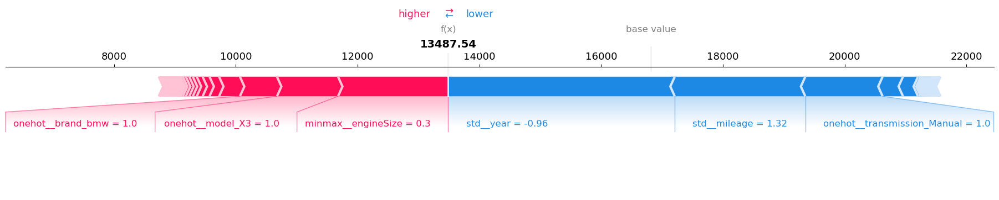

data point 3000


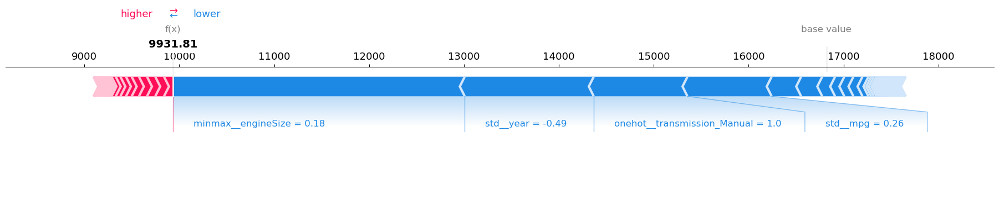

data point 6000


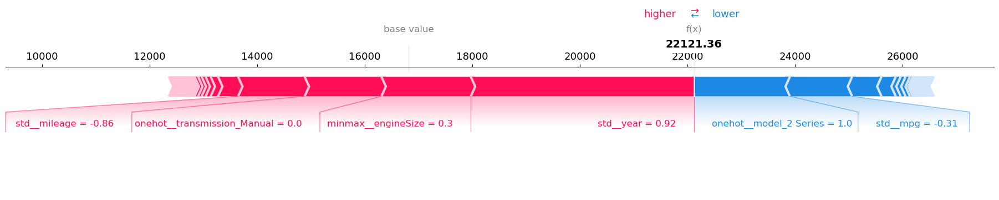

In [421]:
import shap
# load JS visualization code to notebook
shap.initjs()
for i in [0,3000,6000]:
    print("data point {}".format(i))
    display(shap.force_plot(explainer.expected_value, shap_values[i], features=np.around(df_test.iloc[i],2), feature_names=df_test.columns,show=False,matplotlib=True,figsize=(23, 3)))
    plt.savefig('../figures/Local_Feature_Importance_datapoint {}.png'.format(i), dpi=300, bbox_inches='tight')